# Imports

In [2049]:
import json
import re
import matplotlib.pyplot as plt;
import matplotlib.cm as cm
import matplotlib.colors as cl
import numpy as np
import matplotlib as mpl
import pandas as pd
import os
import pathlib
import math
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.gaussian_process import GaussianProcessRegressor, GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF, DotProduct
import scipy 

# Get data files

In [2050]:
file_path = os.getcwd()

In [2051]:
all_files = os.listdir(file_path)    
csv_files = list(filter(lambda f: f.endswith('.csv'), all_files))
csv_files = pd.DataFrame(data = {'file_names': csv_files})


In [2052]:
ID = csv_files["file_names"].str.extract(r"(\d+)")
data_length = len(ID)
print(data_length)

94


In [2053]:
df = {}
totalTrials = np.zeros(shape = (data_length), dtype = int)

for i in range(data_length):
    id = ID[0][i]
    df[id] = pd.read_csv(csv_files["file_names"][i])
    totalTrials[i] = math.ceil(df[id].shape[0]/4)

max_trial = np.max(totalTrials)
total_Trials = np.zeros(shape=(max_trial), dtype=int)

for i in range(max_trial):
    total_Trials[i] = np.count_nonzero(totalTrials==(i+1))

# Get data
extract data from DataFrame to Numpy

In [2054]:
timeBetweenChest = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
decisionTime = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
keyPresses = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
averageKeyTime = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
averageDistance = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
averageSpeed = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
KeyTimes = np.zeros(shape = (max_trial,data_length,4), dtype = float)
Speed = np.zeros(shape = (max_trial,data_length,4), dtype = float)
Distance = np.zeros(shape = (max_trial,data_length,4), dtype = float)
chestOpen = np.zeros(shape = (max_trial,data_length,4), dtype = float)
totalTime = np.zeros(shape = (max_trial,data_length,4), dtype = float)
totalCoins = np.zeros(shape = (max_trial,data_length,4), dtype = float)
caught_no = np.zeros(shape = (max_trial,data_length,4), dtype=int)
subject_ID = np.zeros(shape = (data_length),dtype=int)

In [2055]:
def objectToArray(obj):
    return np.array(list(map(lambda x: float(x),str(obj).split(','))))

In [2056]:
tt_keyTime = np.zeros(shape = (data_length), dtype=float)
tt_speed = np.zeros(shape = (data_length), dtype=float)
tt_distance= np.zeros(shape = (data_length), dtype=float)

In [2057]:
ogres = np.array([[8,16,25],[11,21,25],[9,16,23],[10,18,25]])
for i, id in enumerate(df):
    data = df[id]
    subject_ID[i] = id
    totalTrials[i] = data['trial_no'].to_numpy()[-1]
    for j, index in enumerate(data['environment']):
        trial_no = data.loc[j].at['trial_no']-1
    
        time_chest = objectToArray(data.loc[j].at['Time_Between_Chests'])
        timeBetweenChest[trial_no][i][index-1][0:len(time_chest)] = time_chest
        
        keyPre = objectToArray(data.loc[j].at['Key_Presses']).astype(int)
        keyPresses[trial_no][i][index-1][0:len(keyPre)] = keyPre
        
        keytimes = objectToArray(data.loc[j].at['Key_Times']).astype(int)
        speed = objectToArray(data.loc[j].at['Speed']).astype(int)
        distance = objectToArray(data.loc[j].at['Distance'])
    
        if (trial_no==totalTrials[i]-1):
            tt_keyTime[i] += np.sum(keytimes)
            tt_speed[i] += np.sum(speed)
            tt_distance[i] += np.sum(distance)
        
        for enum, key in enumerate(keyPre):
            if (key>1):
                if (enum ==0): ind = 0
                else: ind = np.sum(keyPre[0:(enum-1)])
                averageKeyTime[trial_no][i][index-1][enum] = np.sum(keytimes[ind:(ind+key)])/(key-1)
                averageSpeed[trial_no][i][index-1][enum] = np.sum(speed[ind:(ind+key)])/(key-1)
                averageDistance[trial_no][i][index-1][enum] = np.sum(distance[ind:(ind+key)])/(key-1)
        
        decisionT = objectToArray(data.loc[j].at['Decision_Times'])
        decisionTime[trial_no][i][index-1][0:len(decisionT)] = decisionT
        chestOpen[trial_no][i][index-1] = data.loc[j].at['Chest_Open']
        caught_no[trial_no][i][index-1] = np.sum(ogres[index-1]<chestOpen[trial_no][i][index-1])
        totalTime[trial_no][i][index-1] = data.loc[j].at['Total_Time']/1000
        totalCoins[trial_no][i][index-1] = data.loc[j].at['Total_coins']     
        

# Get questionaire data

In [2058]:
filepath = os.path.join(file_path,'Questions')
all_files = os.listdir(filepath)    
questions_files = list(filter(lambda f: f.endswith('.csv'), all_files))
questions_files = pd.DataFrame(data = {'file_names': questions_files})

In [2059]:
filepath_2 = os.path.join(file_path,'Questions_2')
all_files_2 = os.listdir(filepath_2)    
questions_files_2 = list(filter(lambda f: f.endswith('.csv'), all_files_2))
questions_files_2 = pd.DataFrame(data = {'file_names': questions_files_2})
ID_Questions_2 = questions_files_2["file_names"].str.extract(r"(\d+)")
data_length_2 = len(questions_files_2)

In [2060]:
filepath_3 = os.path.join(file_path,'Questions_3')
all_files_3 = os.listdir(filepath_3)    
questions_files_3 = list(filter(lambda f: f.endswith('.csv'), all_files_3))
questions_files_3 = pd.DataFrame(data = {'file_names': questions_files_3})
ID_Questions_3 = questions_files_3["file_names"].str.extract(r"(\d+)")
data_length_3 = len(ID_Questions_3)

In [2061]:
state_anxiety_summary = np.empty (shape = (data_length,3), dtype = float)

In [2062]:
state_anxiety_summary[:] = np.nan

In [2063]:

df_Questions_2 = {}
df_Questions_3 = {}

In [2064]:
ID_Questions = questions_files["file_names"].str.extract(r"(\d+)")
data_length = len(ID_Questions)
df_Questions = {}
current_anxiety = np.zeros(shape = (data_length,4), dtype = int)
ID_reverse = np.zeros(shape=(np.max(subject_ID)+1),dtype=int)
color = np.zeros(shape = (np.max(subject_ID)+1), dtype = float)
colors = np.zeros(shape = (data_length), dtype = float)

for i in range(data_length):
    id = ID_Questions[0][i]
    if (int(id)<131):
        df_Questions[id] = pd.read_csv(os.path.join(filepath,questions_files["file_names"][i]), \
                                                    names=['anxiety_1','anxiety_2','anxiety_3','anxiety_4','Q1','Q2','Q3','Q4','Q5'])
    else:
        df_Questions[id] = pd.read_csv(os.path.join(filepath,questions_files["file_names"][i]), \
                                                    names=['mood_1','mood_2','mood_3','mood_4',\
                                                            'mood_1_env1','mood_3_env1','anxiety_1',\
                                                            'mood_1_env2','mood_3_env2','anxiety_2',\
                                                            'mood_1_env3','mood_3_env3','anxiety_3',\
                                                            'mood_1_env4','mood_2_env4','mood_3_env4','mood_4_env4','anxiety_4',\
                                                            'Q1','Q2','Q3','Q4','Q5'])
    index = len(df_Questions[id].columns)-6
    for j in range(4):
        current_anxiety[i][j] = df_Questions[id]['anxiety_'+str(j+1)] 
    color[int(id)] = np.sum(current_anxiety[i][0:3])/3
    state_anxiety_summary[i][0] = color[int(id)]
    ID_reverse[int(id)] = i

for i in range(data_length):
    colors[i] = color[subject_ID[i]]

for i in range(data_length_2):
    id = ID_Questions_2[0][i]
    df_Questions_2[id] = pd.read_csv(os.path.join(filepath_2,questions_files_2["file_names"][i]), \
                                                    names=['anxiety_GNG'])
    state_anxiety_summary[ID_reverse[int(id)]][1] = df_Questions_2[id]['anxiety_GNG'] 

In [2065]:
for i in range(data_length_3):
    id = ID_Questions_3[0][i]
    df_Questions_3[id] = pd.read_csv(os.path.join(filepath_3,questions_files_3["file_names"][i]), \
                                                    names=['motivation','anxiety_AL'])
    state_anxiety_summary[ID_reverse[int(id)]][2] = df_Questions_3[id]['anxiety_AL'] 

In [2066]:
filepath = os.path.join(file_path,'Questions\\Survey')
all_files = os.listdir(filepath)    
survey_files = list(filter(lambda f: f.endswith('.csv'), all_files))
survey_files = pd.DataFrame(data = {'file_names': survey_files})

In [2067]:
survey_data = pd.read_csv(os.path.join(filepath,survey_files["file_names"][0]))
STAI = np.zeros(shape = (data_length), dtype = int)
pro_anxiety = np.zeros(shape = (data_length), dtype = int)
survey_data_id = survey_data['record_id'].to_numpy()

for i in range(data_length):
    STAI[i] = survey_data.loc[survey_data['record_id'] == subject_ID[i]]['stai_baseline']
    pro_anxiety[i] = survey_data.loc[survey_data['record_id'] == subject_ID[i]]['promis_anxiety_baseline']

# Average values for number of key press, time, distance, speed between each pair of key presses

In [2068]:
not_anxious = np.where(colors<=5)
anxious = np.where(colors>5)
anx_label = colors>5

anxious_stai = np.where(STAI>22)
not_anxious_stai = np.where(STAI<=22)
anx_label_stai = STAI>22

anxious_pro = np.where(pro_anxiety>=17)
not_anxious_pro = np.where(pro_anxiety<17)
anx_label_pro = pro_anxiety>16

In [2069]:
np.where(np.logical_xor(anx_label, anx_label_stai) == False)[0].shape

(59,)

In [2070]:
np.where((anx_label == True) & (anx_label_stai ==False))[0].shape

(18,)

In [2071]:
np.where((anx_label == True) & (anx_label_pro ==False))[0].shape

(27,)

In [2072]:
np.where(np.logical_xor(anx_label, anx_label_pro) == False)[0].shape

(56,)

In [2073]:
keypress_env1 = np.zeros(shape = (25), dtype = float)
keypress_env2 = np.zeros(shape = (25), dtype = float)
keypress_env3 = np.zeros(shape = (25), dtype = float)
keypress_env4 = np.zeros(shape = (25), dtype = float)

keyTimes_env1 = np.zeros(shape = (25), dtype = float)
keyTimes_env2 = np.zeros(shape = (25), dtype = float)
keyTimes_env3 = np.zeros(shape = (25), dtype = float)
keyTimes_env4 = np.zeros(shape = (25), dtype = float)

speed_env1 = np.zeros(shape = (25), dtype = float)
speed_env2 = np.zeros(shape = (25), dtype = float)
speed_env3 = np.zeros(shape = (25), dtype = float)
speed_env4 = np.zeros(shape = (25), dtype = float)

distance_env1 = np.zeros(shape = (25), dtype = float)
distance_env2 = np.zeros(shape = (25), dtype = float)
distance_env3 = np.zeros(shape = (25), dtype = float)
distance_env4 = np.zeros(shape = (25), dtype = float)

decision_env1 = np.zeros(shape = (25), dtype = float)
decision_env2 = np.zeros(shape = (25), dtype = float)
decision_env3 = np.zeros(shape = (25), dtype = float)
decision_env4 = np.zeros(shape = (25), dtype = float)

for id in not_anxious[0]:

    keypress_env1 += keyPresses[totalTrials[id]-1,id,0,:]
    keypress_env2 += keyPresses[totalTrials[id]-1,id,1,:]
    keypress_env3 += keyPresses[totalTrials[id]-1,id,2,:]
    keypress_env4 += keyPresses[totalTrials[id]-1,id,3,:]
    
    keyTimes_env1 += averageKeyTime[totalTrials[id]-1,id,0,:]
    keyTimes_env2 += averageKeyTime[totalTrials[id]-1,id,1,:]
    keyTimes_env3 += averageKeyTime[totalTrials[id]-1,id,2,:]
    keyTimes_env4 += averageKeyTime[totalTrials[id]-1,id,3,:]
    
    speed_env1 += averageSpeed[totalTrials[id]-1,id,0,:]
    speed_env2 += averageSpeed[totalTrials[id]-1,id,1,:]
    speed_env3 += averageSpeed[totalTrials[id]-1,id,2,:]
    speed_env4 += averageSpeed[totalTrials[id]-1,id,3,:]
    
    distance_env1 += averageDistance[totalTrials[id]-1,id,0,:]
    distance_env2 += averageDistance[totalTrials[id]-1,id,1,:]
    distance_env3 += averageDistance[totalTrials[id]-1,id,2,:]
    distance_env4 += averageDistance[totalTrials[id]-1,id,3,:]
    
    decision_env1 += decisionTime[totalTrials[id]-1,id,0,:]
    decision_env2 += decisionTime[totalTrials[id]-1,id,1,:]
    decision_env3 += decisionTime[totalTrials[id]-1,id,2,:]
    decision_env4 += decisionTime[totalTrials[id]-1,id,3,:]

not_anxious_total = not_anxious[0].shape[0]

keypress_env1 /= not_anxious_total
keypress_env2 /= not_anxious_total
keypress_env3 /= not_anxious_total
keypress_env4 /= not_anxious_total

keyTimes_env1 /= not_anxious_total
keyTimes_env2 /= not_anxious_total
keyTimes_env3 /= not_anxious_total
keyTimes_env4 /= not_anxious_total

speed_env1 /= not_anxious_total
speed_env2 /= not_anxious_total
speed_env3 /= not_anxious_total
speed_env4 /= not_anxious_total

distance_env1 /= not_anxious_total
distance_env2 /= not_anxious_total
distance_env3 /= not_anxious_total
distance_env4 /= not_anxious_total

decision_env1 /= not_anxious_total
decision_env2 /= not_anxious_total
decision_env3 /= not_anxious_total
decision_env4 /= not_anxious_total

In [2074]:
anx_keypress_env1 = np.zeros(shape = (25), dtype = float)
anx_keypress_env2 = np.zeros(shape = (25), dtype = float)
anx_keypress_env3 = np.zeros(shape = (25), dtype = float)
anx_keypress_env4 = np.zeros(shape = (25), dtype = float)

anx_keyTimes_env1 = np.zeros(shape = (25), dtype = float)
anx_keyTimes_env2 = np.zeros(shape = (25), dtype = float)
anx_keyTimes_env3 = np.zeros(shape = (25), dtype = float)
anx_keyTimes_env4 = np.zeros(shape = (25), dtype = float)

anx_speed_env1 = np.zeros(shape = (25), dtype = float)
anx_speed_env2 = np.zeros(shape = (25), dtype = float)
anx_speed_env3 = np.zeros(shape = (25), dtype = float)
anx_speed_env4 = np.zeros(shape = (25), dtype = float)

anx_distance_env1 = np.zeros(shape = (25), dtype = float)
anx_distance_env2 = np.zeros(shape = (25), dtype = float)
anx_distance_env3 = np.zeros(shape = (25), dtype = float)
anx_distance_env4 = np.zeros(shape = (25), dtype = float)

anx_decision_env1 = np.zeros(shape = (25), dtype = float)
anx_decision_env2 = np.zeros(shape = (25), dtype = float)
anx_decision_env3 = np.zeros(shape = (25), dtype = float)
anx_decision_env4 = np.zeros(shape = (25), dtype = float)

for id in anxious[0]:

    anx_keypress_env1 += keyPresses[totalTrials[id]-1,id,0,:]
    anx_keypress_env2 += keyPresses[totalTrials[id]-1,id,1,:]
    anx_keypress_env3 += keyPresses[totalTrials[id]-1,id,2,:]
    anx_keypress_env4 += keyPresses[totalTrials[id]-1,id,3,:]
    
    anx_keyTimes_env1 += averageKeyTime[totalTrials[id]-1,id,0,:]
    anx_keyTimes_env2 += averageKeyTime[totalTrials[id]-1,id,1,:]
    anx_keyTimes_env3 += averageKeyTime[totalTrials[id]-1,id,2,:]
    anx_keyTimes_env4 += averageKeyTime[totalTrials[id]-1,id,3,:]
    
    anx_speed_env1 += averageSpeed[totalTrials[id]-1,id,0,:]
    anx_speed_env2 += averageSpeed[totalTrials[id]-1,id,1,:]
    anx_speed_env3 += averageSpeed[totalTrials[id]-1,id,2,:]
    anx_speed_env4 += averageSpeed[totalTrials[id]-1,id,3,:]
    
    anx_distance_env1 += averageDistance[totalTrials[id]-1,id,0,:]
    anx_distance_env2 += averageDistance[totalTrials[id]-1,id,1,:]
    anx_distance_env3 += averageDistance[totalTrials[id]-1,id,2,:]
    anx_distance_env4 += averageDistance[totalTrials[id]-1,id,3,:]
    
    anx_decision_env1 += decisionTime[totalTrials[id]-1,id,0,:]
    anx_decision_env2 += decisionTime[totalTrials[id]-1,id,1,:]
    anx_decision_env3 += decisionTime[totalTrials[id]-1,id,2,:]
    anx_decision_env4 += decisionTime[totalTrials[id]-1,id,3,:]

anxious_total = anxious[0].shape[0]

anx_keypress_env1 /= anxious_total
anx_keypress_env2 /= anxious_total
anx_keypress_env3 /= anxious_total
anx_keypress_env4 /= anxious_total

anx_keyTimes_env1 /= anxious_total
anx_keyTimes_env2 /= anxious_total
anx_keyTimes_env3 /= anxious_total
anx_keyTimes_env4 /= anxious_total

anx_speed_env1 /= anxious_total
anx_speed_env2 /= anxious_total
anx_speed_env3 /= anxious_total
anx_speed_env4 /= anxious_total

anx_distance_env1 /= anxious_total
anx_distance_env2 /= anxious_total
anx_distance_env3 /= anxious_total
anx_distance_env4 /= anxious_total

anx_decision_env1 /= anxious_total
anx_decision_env2 /= anxious_total
anx_decision_env3 /= anxious_total
anx_decision_env4 /= anxious_total

# Data processing

In [2075]:
not_skipping = np.zeros(shape = (data_length), dtype=bool)
for i in range(data_length):
    if (chestOpen[totalTrials[i]-1,i,0:3]==25.0).all():
        not_skipping[i]=1

## Data preparation for linear regressions and GPR

In [2076]:
keyPress_flatten = np.zeros(shape = (data_length,100), dtype=int)
avg_keyTimes_flatten = np.zeros(shape = (data_length,100), dtype=float)
avg_distance_flatten = np.zeros(shape = (data_length,100), dtype=float)
avg_speed_flatten = np.zeros(shape = (data_length,100), dtype=float)
avg_decisionTime_flatten = np.zeros(shape = (data_length,100), dtype=float)
chestOpen_flatten = np.zeros(shape = (data_length,4), dtype=int)
totalCoins_flatten = np.zeros(shape = (data_length,4), dtype=float)
caught_flatten = np.zeros(shape = (data_length), dtype=int)
speed_diff_flatten = np.zeros(shape = (data_length,100), dtype=float)

keyPress_scaled = np.zeros(shape = (data_length,100), dtype=int)
avg_keyTimes_scaled = np.zeros(shape = (data_length,100), dtype=float)
avg_distance_scaled = np.zeros(shape = (data_length,100), dtype=float)
avg_speed_scaled = np.zeros(shape = (data_length,100), dtype=float)
avg_decisionTime_scaled = np.zeros(shape = (data_length,100), dtype=float)
chestOpen_scaled = np.zeros(shape = (data_length,4), dtype=int)
totalCoins_scaled = np.zeros(shape = (data_length,4), dtype=float)
caught_scaled = np.zeros(shape = (data_length), dtype=int)
speed_diff_scaled = np.zeros(shape = (data_length,100), dtype=float)

overall_keyPress = np.zeros(shape=(data_length),dtype=float)
overall_keyTime = np.zeros(shape=(data_length),dtype=float)
overall_distance = np.zeros(shape=(data_length),dtype=float)
overall_speed = np.zeros(shape=(data_length),dtype=float)
overall_decisionTime = np.zeros(shape=(data_length),dtype=float)

In [2077]:
speed_dummy = np.zeros(shape = (max_trial,data_length,4,25), dtype = float)
for i in range(data_length):
    speed_dummy[totalTrials[i]-1,i,:,1:25] = averageSpeed[totalTrials[i]-1,i,:,0:24]
    speed_dummy[totalTrials[i]-1,i,:,0] = 250
speed_diff = averageSpeed - speed_dummy

In [2078]:
mean_keyPress = np.mean(keyPresses, axis = 3)
keypress_change = mean_keyPress[:,:,2:4] -  mean_keyPress[:,:,1:3]

mean_keyTime = np.mean(averageKeyTime, axis = 3)
keyTime_change = mean_keyTime[:,:,2:4] -  mean_keyTime[:,:,1:3]

mean_distance = np.mean(averageDistance, axis = 3)
distance_change = mean_distance[:,:,2:4] -  mean_distance[:,:,1:3]

mean_speed = np.mean(averageSpeed, axis = 3)
speed_change = mean_speed[:,:,2:4] -  mean_speed[:,:,1:3]

mean_speed_diff = np.mean(speed_diff, axis = 3)
speedDiff_change = mean_speed_diff[:,:,2:4] -  mean_speed_diff[:,:,1:3]

mean_decisionTime = np.mean(decisionTime, axis = 3)
decisionTIme_change = mean_decisionTime[:,:,2:4] -  mean_decisionTime[:,:,1:3]

state_anx_change = current_anxiety[:,1:3] - current_anxiety[:,0:2]

In [2079]:
keypress_change = keypress_change[totalTrials-1,np.arange(data_length)]
keyTime_change = keyTime_change[totalTrials-1,np.arange(data_length)]
distance_change = distance_change[totalTrials-1,np.arange(data_length)]
speed_change = speed_change[totalTrials-1,np.arange(data_length)]
speedDiff_change = speedDiff_change[totalTrials-1,np.arange(data_length)]
decisionTIme_change = decisionTIme_change[totalTrials-1,np.arange(data_length)]

In [2080]:
for i in range(data_length):
    keyPress_flatten[i] = keyPresses[totalTrials[i]-1,i].flatten() 
    avg_keyTimes_flatten[i] = averageKeyTime[totalTrials[i]-1,i].flatten()    
    avg_distance_flatten[i] = averageDistance[totalTrials[i]-1,i].flatten()   
    avg_speed_flatten[i] = averageSpeed[totalTrials[i]-1,i].flatten()    
    avg_decisionTime_flatten[i] = decisionTime[totalTrials[i]-1,i].flatten()   
    chestOpen_flatten[i] = chestOpen[totalTrials[i]-1,i].flatten()
    caught_flatten[i] = np.sum(caught_no[totalTrials[i]-1,i])
    totalCoins_flatten[i] = totalCoins[totalTrials[i]-1,i].flatten()
    speed_diff_flatten[i] = speed_diff[totalTrials[i]-1,i].flatten()

In [2081]:
def min_max_scaling(array):
    return ((array-np.min(array))/(np.max(array)-np.min(array)))

def normalization(array):
    return (array - np.mean(array))/-np.std(array)

def sum_data(array):
    mask = (array!=0)
    return np.sum(array,axis =1)/np.sum(mask,axis=1)

In [2082]:
keyPress_scaled = min_max_scaling(keyPress_flatten)
avg_keyTimes_scaled = min_max_scaling(avg_keyTimes_flatten)
avg_distance_scaled = min_max_scaling(avg_distance_flatten)
avg_speed_scaled = min_max_scaling(avg_speed_flatten)
speed_diff_scaled = min_max_scaling(speed_diff_flatten)
avg_decisionTime_scaled = min_max_scaling(avg_decisionTime_flatten)
chestOpen_scaled = min_max_scaling(chestOpen_flatten)
totalCoins_scaled = min_max_scaling(totalCoins_flatten)
caught_scaled = min_max_scaling(caught_flatten).reshape(-1,1)

In [2083]:
train_indices, test_indices = train_test_split(np.arange(data_length), train_size = 0.6, random_state = 0)
y = np.zeros(shape = (data_length), dtype = float)
y = colors
y_train = y[train_indices]
y_test = y[test_indices]

y_stai = np.zeros(shape = (data_length), dtype=int)
y_pro = np.zeros(shape = (data_length), dtype=int)

y_stai = STAI
y_pro = pro_anxiety


In [2084]:
train_data_1 = np.concatenate((keyPress_scaled[train_indices],avg_keyTimes_scaled[train_indices], avg_distance_scaled[train_indices],\
            avg_speed_scaled[train_indices],avg_decisionTime_scaled[train_indices], \
                chestOpen_scaled[train_indices], totalCoins_scaled[train_indices]), axis = 1)

test_data_1 = np.concatenate((keyPress_scaled[test_indices],avg_keyTimes_scaled[test_indices], avg_distance_scaled[test_indices],\
            avg_speed_scaled[test_indices],avg_decisionTime_scaled[test_indices], \
                chestOpen_scaled[test_indices], totalCoins_scaled[test_indices]), axis = 1)

In [2085]:
train_data_2 = np.concatenate((keyPress_scaled[train_indices],avg_keyTimes_scaled[train_indices], avg_distance_scaled[train_indices],\
            avg_speed_scaled[train_indices],avg_decisionTime_scaled[train_indices], \
                caught_scaled[train_indices], totalCoins_scaled[train_indices]), axis = 1)

test_data_2 = np.concatenate((keyPress_scaled[test_indices],avg_keyTimes_scaled[test_indices], avg_distance_scaled[test_indices],\
            avg_speed_scaled[test_indices],avg_decisionTime_scaled[test_indices], \
                caught_scaled[test_indices], totalCoins_scaled[test_indices]), axis = 1)

In [2086]:
keyPress_scaled.shape

(94, 100)

In [2087]:
tt_keyPress = sum_data(keyPress_flatten)
tt_speedDiff = sum_data(speed_diff_flatten)
tt_decisionTime = sum_data(avg_decisionTime_flatten)
mask = (keyPress_flatten!=0)

tt_keyTime /= (np.sum(keyPress_flatten, axis = 1)-np.sum(mask, axis =1))
tt_distance /= (np.sum(keyPress_flatten, axis = 1)-np.sum(mask, axis =1))
tt_speed /= (np.sum(keyPress_flatten, axis = 1)-np.sum(mask, axis =1))

In [2088]:

overall_keyPress = min_max_scaling(tt_keyPress)
overall_keyTime = min_max_scaling(tt_keyTime)
overall_distance = min_max_scaling(tt_distance)
overall_speed = min_max_scaling(tt_speed)
overall_decisionTime = min_max_scaling(tt_decisionTime)

In [2089]:
train_data_overall_1 = np.concatenate((np.array([overall_keyPress[train_indices]]).T, np.array([overall_keyTime[train_indices]]).T, \
    np.array([overall_distance[train_indices]]).T, np.array([overall_speed[train_indices]]).T, np.array([overall_decisionTime[train_indices]]).T,\
        chestOpen_scaled[train_indices], totalCoins_scaled[train_indices]), axis = 1)

test_data_overall_1 = np.concatenate((np.array([overall_keyPress[test_indices]]).T, np.array([overall_keyTime[test_indices]]).T, \
    np.array([overall_distance[test_indices]]).T, np.array([overall_speed[test_indices]]).T, np.array([overall_decisionTime[test_indices]]).T,\
        chestOpen_scaled[test_indices], totalCoins_scaled[test_indices]), axis = 1)

In [2090]:
train_data_overall_2 = np.concatenate((np.array([overall_keyPress[train_indices]]).T, np.array([overall_keyTime[train_indices]]).T, \
    np.array([overall_distance[train_indices]]).T, np.array([overall_speed[train_indices]]).T, np.array([overall_decisionTime[train_indices]]).T,\
        caught_scaled[train_indices], totalCoins_scaled[train_indices]), axis = 1)

test_data_overall_2 = np.concatenate((np.array([overall_keyPress[test_indices]]).T, np.array([overall_keyTime[test_indices]]).T, \
    np.array([overall_distance[test_indices]]).T, np.array([overall_speed[test_indices]]).T, np.array([overall_decisionTime[test_indices]]).T,\
        caught_scaled[test_indices], totalCoins_scaled[test_indices]), axis = 1)

In [2091]:
train_data_overall_3 = np.concatenate((np.array([overall_keyPress[train_indices]]).T, np.array([overall_keyTime[train_indices]]).T, \
    np.array([overall_distance[train_indices]]).T, np.array([overall_decisionTime[train_indices]]).T,\
        caught_scaled[train_indices], totalCoins_scaled[train_indices]), axis = 1)

test_data_overall_3 = np.concatenate((np.array([overall_keyPress[test_indices]]).T, np.array([overall_keyTime[test_indices]]).T, \
    np.array([overall_distance[test_indices]]).T,  np.array([overall_decisionTime[test_indices]]).T,\
        caught_scaled[test_indices], totalCoins_scaled[test_indices]), axis = 1)

In [2092]:
ogres = np.array([8,16,36,46,59,66,73,85,93])
mask = np.zeros(shape = (5,data_length,100), dtype=int)
chests = chestOpen_flatten[:] + np.array([-1,24,49,74])

In [2093]:
def data_timebin_before(timebin, data_len, ogres, mask, *data):
    for i in range(5):
        mask[i] = (data[i]!=0)
        
    data_caught = np.zeros(shape = (data_len,5,timebin), dtype=float)
    data_caught_flatten = np.zeros(shape = (data_len,5*timebin), dtype=float)
    
    for i in range(data_len):
        for j in range(timebin):
            data_caught[i][0][j] = np.sum(data[0][i,ogres-j])/np.sum(mask[0][i,ogres-j]) if (np.sum(mask[0][i,ogres-j])!=0) else 0
            data_caught[i][1][j] = np.sum(data[1][i,ogres-j])/np.sum(mask[1][i,ogres-j]) if (np.sum(mask[1][i,ogres-j])!=0) else 0
            data_caught[i][2][j] = np.sum(data[2][i,ogres-j])/np.sum(mask[2][i,ogres-j]) if (np.sum(mask[2][i,ogres-j])!=0) else 0
            data_caught[i][3][j] = np.sum(data[3][i,ogres-j])/np.sum(mask[3][i,ogres-j]) if (np.sum(mask[3][i,ogres-j])!=0) else 0
            data_caught[i][4][j] = np.sum(data[4][i,ogres-j])/np.sum(mask[4][i,ogres-j]) if (np.sum(mask[4][i,ogres-j])!=0) else 0
            
    
    for i in range(data_len):
        data_caught_flatten[i] = data_caught[i].flatten()
        
    return data_caught_flatten

def data_timebin_after(timebin, data_len, ogres, mask, *data):
    for i in range(5):
        mask[i] = (data[i]!=0)
        
    data_caught = np.zeros(shape = (data_len,5,timebin), dtype=float)
    data_caught_flatten = np.zeros(shape = (data_len,5*timebin), dtype=float)
    
    for i in range(data_len):
        for j in range(timebin):
            data_caught[i][0][j] = np.sum(data[0][i,ogres+j+1])/np.sum(mask[0][i,ogres+j+1]) if (np.sum(mask[0][i,ogres+j+1])!=0) else 0
            data_caught[i][1][j] = np.sum(data[1][i,ogres+j+1])/np.sum(mask[1][i,ogres+j+1]) if (np.sum(mask[1][i,ogres+j+1])!=0) else 0
            data_caught[i][2][j] = np.sum(data[2][i,ogres+j+1])/np.sum(mask[2][i,ogres+j+1]) if (np.sum(mask[2][i,ogres+j+1])!=0) else 0
            data_caught[i][3][j] = np.sum(data[3][i,ogres+j+1])/np.sum(mask[3][i,ogres+j+1]) if (np.sum(mask[3][i,ogres+j+1])!=0) else 0
            data_caught[i][4][j] = np.sum(data[4][i,ogres+j+1])/np.sum(mask[4][i,ogres+j+1]) if (np.sum(mask[4][i,ogres+j+1])!=0) else 0
            
    
    for i in range(data_len):
        data_caught_flatten[i] = data_caught[i].flatten()
        
    return data_caught_flatten

def data_timebin_before_end(timebin, data_len, chests, mask, *data):
    for i in range(5):
        mask[i] = (data[i]!=0)
        
    data_end = np.zeros(shape = (data_len,5,timebin), dtype=float)
    data_end_flatten = np.zeros(shape = (data_len,5*timebin), dtype=float)
    
    for i in range(data_len):
        for j in range(timebin):
            data_end[i][0][j] = np.sum(data[0][i,chests[i]-j])/np.sum(mask[0][i,chests[i]-j]) if (np.sum(mask[0][i,chests[i]-j])!=0) else 0
            data_end[i][1][j] = np.sum(data[1][i,chests[i]-j])/np.sum(mask[1][i,chests[i]-j]) if (np.sum(mask[1][i,chests[i]-j])!=0) else 0
            data_end[i][2][j] = np.sum(data[2][i,chests[i]-j])/np.sum(mask[2][i,chests[i]-j]) if (np.sum(mask[2][i,chests[i]-j])!=0) else 0
            data_end[i][3][j] = np.sum(data[3][i,chests[i]-j])/np.sum(mask[3][i,chests[i]-j]) if (np.sum(mask[3][i,chests[i]-j])!=0) else 0
            data_end[i][4][j] = np.sum(data[4][i,chests[i]-j])/np.sum(mask[4][i,chests[i]-j]) if (np.sum(mask[4][i,chests[i]-j])!=0) else 0
            
    
    for i in range(data_len):
        data_end_flatten[i] = data_end[i].flatten()
        
    return data_end_flatten


In [2094]:
data_timebin_1_before_end = data_timebin_before_end(1,data_length,chests,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

data_timebin_3_before_end = data_timebin_before_end(3,data_length,chests,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

data_timebin_1_before_end = np.concatenate((data_timebin_1_before_end,caught_scaled), axis = 1)
data_timebin_3_before_end = np.concatenate((data_timebin_3_before_end,caught_scaled), axis = 1)

data_timebin_1_before = data_timebin_before(1,data_length,ogres,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

data_timebin_3_before = data_timebin_before(3,data_length,ogres,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

data_timebin_1_before = np.concatenate((data_timebin_1_before,caught_scaled), axis = 1)
data_timebin_3_before = np.concatenate((data_timebin_3_before,caught_scaled), axis = 1)

data_timebin_1_after = data_timebin_after(1,data_length,ogres,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

data_timebin_1_after = np.concatenate((data_timebin_1_after,caught_scaled), axis = 1)


In [2095]:
for i in range(5):
    data_timebin_1_before_end[:,i] = min_max_scaling(data_timebin_1_before_end[:,i])
    data_timebin_3_before_end[:,i] = min_max_scaling(data_timebin_3_before_end[:,i])
    data_timebin_1_before[:,i] = min_max_scaling(data_timebin_1_before[:,i])
    data_timebin_3_before[:,i] = min_max_scaling(data_timebin_3_before[:,i])
    data_timebin_1_after[:,i] = min_max_scaling(data_timebin_1_after[:,i])

In [2096]:
y_norm = normalization(y)
y_norm_train = colors[train_indices]
y_norm_test = colors[test_indices]

In [2097]:
GPR_keyPress = normalization(sum_data(keyPress_flatten)).reshape(-1,1)
GPR_keyTime = normalization(sum_data(avg_keyTimes_flatten)).reshape(-1,1)
GPR_distance = normalization(sum_data(avg_distance_flatten)).reshape(-1,1)
GPR_speed = normalization(sum_data(avg_speed_flatten)).reshape(-1,1)
GPR_decisionTime = normalization(sum_data(avg_decisionTime_flatten)).reshape(-1,1)
GPR_data = np.concatenate((GPR_keyPress,GPR_keyTime,GPR_distance,GPR_speed,GPR_decisionTime), axis =1)

In [2098]:
GPR_data_timebin_1_before_end = data_timebin_before_end(1,data_length,chests,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

GPR_data_timebin_1_before = data_timebin_before(1,data_length,ogres,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

GPR_data_timebin_1_after = data_timebin_after(1,data_length,ogres,mask,\
    keyPress_flatten,avg_keyTimes_flatten,avg_distance_flatten,avg_speed_flatten,avg_decisionTime_flatten)

for i in range(5):
    GPR_data_timebin_1_before_end[:,i] = normalization(GPR_data_timebin_1_before_end[:,i])
    GPR_data_timebin_1_before[:,i] = normalization(GPR_data_timebin_1_before[:,i])
    GPR_data_timebin_1_after[:,i] = normalization(GPR_data_timebin_1_after[:,i])

In [2099]:
def gp_plot(X,y,label, X_train, y_train, X_test, mean_pred, std_pred, title):
    plt.plot(X, y, label = label, linestyle="dotted")
    plt.scatter(X_train, y_train, label = "train_data")
    plt.plot(X_test, mean_pred, label="Mean prediction for test_data")
    plt.fill_between(
        X_test.ravel(),
        mean_pred - 1.96 * std_pred,
        mean_pred + 1.96 * std_pred,
        alpha=0.5,
        label=r"95% confidence interval",
    )
    plt.legend()
    plt.xlabel("$x$")
    plt.ylabel("$f(x)$")
    _ = plt.title(title)

In [2100]:
final_state_anxiety_summary = state_anxiety_summary[~np.isnan(state_anxiety_summary[:,2]),:]

In [2132]:
final_state_anxiety_summary.shape

(91, 3)

In [2133]:
anxiety_diff = np.zeros(shape = (final_state_anxiety_summary.shape[0],2), dtype=int)
anxiety_diff[:,0] = final_state_anxiety_summary[:,0]-final_state_anxiety_summary[:,1]
anxiety_diff[:,1] = final_state_anxiety_summary[:,0]-final_state_anxiety_summary[:,2]

# Statistical tests for the anxious and not anxious groups

## State anxiety = average of anxiety score after env 1, 2 and 3

In [2102]:
stats = np.zeros(shape=(6),dtype=float)
pvalue = np.zeros(shape=(6),dtype=float)

### T-test

In [2103]:
stats_pearson_state, pvalue_pearson_state = np.zeros(shape = 5, dtype=float), np.zeros(shape = 5, dtype=float)

stats_pearson_state[0], pvalue_pearson_state[0] = scipy.stats.pearsonr(tt_keyPress,colors)
stats_pearson_state[1], pvalue_pearson_state[1] = scipy.stats.pearsonr(tt_keyTime,colors)
stats_pearson_state[2], pvalue_pearson_state[2] = scipy.stats.pearsonr(tt_distance,colors)
stats_pearson_state[3], pvalue_pearson_state[3] = scipy.stats.pearsonr(tt_speed,colors)
stats_pearson_state[4], pvalue_pearson_state[4] = scipy.stats.pearsonr(tt_decisionTime,colors)

In [2104]:
print('Pearson correlation between features and state anxiety scores')
print('stats and p-value for number of key press: stats = ' + str(stats_pearson_state[0]) + ',   p-value = ' + str(pvalue_pearson_state[0]))
print('stats and p-value for time between key press: stats = ' + str(stats_pearson_state[1]) + ',   p-value = ' + str(pvalue_pearson_state[1]))
print('stats and p-value for distance between ogre and player at each key press: stats = ' + str(stats_pearson_state[2]) + ',   p-value = ' + str(pvalue_pearson_state[2]))
print('stats and p-value for speed at key press: stats = ' + str(stats_pearson_state[3]) + ',   p-value = ' + str(pvalue_pearson_state[3]))
print('stats and p-value for decision time at chest: stats = ' + str(stats_pearson_state[4]) + ',   p-value = ' + str(pvalue_pearson_state[4]))

Pearson correlation between features and state anxiety scores
stats and p-value for number of key press: stats = -0.3356904300979964,   p-value = 0.0009409095261709389
stats and p-value for time between key press: stats = -0.18129698638238137,   p-value = 0.08033530589563954
stats and p-value for distance between ogre and player at each key press: stats = -0.22909860158130546,   p-value = 0.02634392675320948
stats and p-value for speed at key press: stats = 0.6265584037646608,   p-value = 1.4311025009998218e-11
stats and p-value for decision time at chest: stats = 0.28016439430954937,   p-value = 0.006238951561573584


In [2105]:
stats[0] , pvalue[0] = scipy.stats.ttest_ind(tt_keyPress[anxious],tt_keyPress[not_anxious],equal_var=False)
stats[1] , pvalue[1] = scipy.stats.ttest_ind(tt_keyTime[anxious],tt_keyTime[not_anxious],equal_var=False)
stats[2] , pvalue[2] = scipy.stats.ttest_ind(tt_distance[anxious],tt_distance[not_anxious],equal_var=False)
stats[3] , pvalue[3] = scipy.stats.ttest_ind(tt_speed[anxious],tt_speed[not_anxious],equal_var=False)
stats[4] , pvalue[4] = scipy.stats.ttest_ind(tt_decisionTime[anxious],tt_decisionTime[not_anxious],equal_var=False)
stats[5] , pvalue[5] = scipy.stats.ttest_ind(tt_speedDiff[anxious],tt_speedDiff[not_anxious],equal_var=False)

In [2106]:
stats

array([-3.1482003 , -1.19971661, -2.16890753,  6.31970745,  2.45976209,
        6.96613019])

In [2107]:
print('p-value for number of key press = ' + str(pvalue[0]))
print('p-value for time between key press = ' + str(pvalue[1]))
print('p-value for distance between ogre and player at each key press = ' + str(pvalue[2]))
print('p-value for speed at key press = ' + str(pvalue[3]))
print('p-value for decision time at chest = ' + str(pvalue[4]))
print('p-value for speed change between chests = ' + str(pvalue[5]))

p-value for number of key press = 0.003194580409724986
p-value for time between key press = 0.23785135729195983
p-value for distance between ogre and player at each key press = 0.0364437458642768
p-value for speed at key press = 1.1034200658278091e-07
p-value for decision time at chest = 0.0161817528506637
p-value for speed change between chests = 3.381014116857613e-09


### Pearson correlation for difference in anxiety and behavior across different environments

In [2108]:
stats_pearson = np.zeros(shape=(2,6),dtype=float)
pvalue_pearson = np.zeros(shape=(2,6),dtype=float)

for i in range(2):
    stats_pearson[i,0] , pvalue_pearson[i,0] = scipy.stats.pearsonr(keypress_change[:,i],state_anx_change[:,i])
    stats_pearson[i,1] , pvalue_pearson[i,1] = scipy.stats.pearsonr(keyTime_change[:,i],state_anx_change[:,i])
    stats_pearson[i,2] , pvalue_pearson[i,2] = scipy.stats.pearsonr(distance_change[:,i],state_anx_change[:,i])
    stats_pearson[i,3] , pvalue_pearson[i,3] = scipy.stats.pearsonr(speed_change[:,i],state_anx_change[:,i])
    stats_pearson[i,4] , pvalue_pearson[i,4] = scipy.stats.pearsonr(decisionTIme_change[:,i],state_anx_change[:,i])
    stats_pearson[i,5] , pvalue_pearson[i,5] = scipy.stats.pearsonr(speedDiff_change[:,i],state_anx_change[:,i])

In [2109]:
print('Pearson correlation for difference in anxiety score from env 2 to 3')
print('stats and p-value for number of key press: stats = ' + str(stats_pearson[0,0]) + ',   p-value = ' + str(pvalue_pearson[0,0]))
print('stats and p-value for time between key press: stats = ' + str(stats_pearson[0,1]) + ',   p-value = ' + str(pvalue_pearson[0,1]))
print('stats and p-value for distance between ogre and player at each key press: stats = ' + str(stats_pearson[0,2]) + ',   p-value = ' + str(pvalue_pearson[0,2]))
print('stats and p-value for speed at key press: stats = ' + str(stats_pearson[0,3]) + ',   p-value = ' + str(pvalue_pearson[0,3]))
print('stats and p-value for decision time at chest: stats = ' + str(stats_pearson[0,4]) + ',   p-value = ' + str(pvalue_pearson[0,4]))
print('stats and p-value for speed change between chests: stats = ' + str(stats_pearson[0,5]) + ',   p-value = ' + str(pvalue_pearson[0,5]))

Pearson correlation for difference in anxiety score from env 2 to 3
stats and p-value for number of key press: stats = 0.06320915684381098,   p-value = 0.5450185435048535
stats and p-value for time between key press: stats = 0.06242463480758435,   p-value = 0.5500302872110516
stats and p-value for distance between ogre and player at each key press: stats = 0.05543630671400161,   p-value = 0.5956322848260943
stats and p-value for speed at key press: stats = 0.03092875969104008,   p-value = 0.767288069751346
stats and p-value for decision time at chest: stats = -0.08729253269865432,   p-value = 0.4028133864203155
stats and p-value for speed change between chests: stats = 0.09096021697577929,   p-value = 0.38326200834831897


In [2110]:
print('Pearson correlation for difference in anxiety score from env 3 to 4')
print('stats and p-value for number of key press: stats = ' + str(stats_pearson[1,0]) + ',   p-value = ' + str(pvalue_pearson[1,0]))
print('stats and p-value for time between key press: stats = ' + str(stats_pearson[1,1]) + ',   p-value = ' + str(pvalue_pearson[1,1]))
print('stats and p-value for distance between ogre and player at each key press: stats = ' + str(stats_pearson[1,2]) + ',   p-value = ' + str(pvalue_pearson[1,2]))
print('stats and p-value for speed at key press: stats = ' + str(stats_pearson[1,3]) + ',   p-value = ' + str(pvalue_pearson[1,3]))
print('stats and p-value for decision time at chest: stats = ' + str(stats_pearson[1,4]) + ',   p-value = ' + str(pvalue_pearson[1,4]))
print('stats and p-value for speed change between chests: stats = ' + str(stats_pearson[1,5]) + ',   p-value = ' + str(pvalue_pearson[1,5]))

Pearson correlation for difference in anxiety score from env 3 to 4
stats and p-value for number of key press: stats = 0.30774144638023276,   p-value = 0.0025501383037487553
stats and p-value for time between key press: stats = 0.26645353786728565,   p-value = 0.009434136463701632
stats and p-value for distance between ogre and player at each key press: stats = 0.2910854757605068,   p-value = 0.004422661779834292
stats and p-value for speed at key press: stats = 0.3108276764604112,   p-value = 0.002294739358191433
stats and p-value for decision time at chest: stats = 0.1314544258905669,   p-value = 0.20661300275514524
stats and p-value for speed change between chests: stats = 0.34393083056312324,   p-value = 0.0006885906924792384


## Trait anxiety: STAI

In [2111]:
stats_pearson_stai, pvalue_pearson_stai = np.zeros(shape = 5, dtype=float), np.zeros(shape = 5, dtype=float)
stats_pearson_pro, pvalue_pearson_pro = np.zeros(shape = 5, dtype=float), np.zeros(shape = 5, dtype=float)

In [2112]:
stats_pearson_stai[0], pvalue_pearson_stai[0] = scipy.stats.pearsonr(tt_keyPress,STAI)
stats_pearson_stai[1], pvalue_pearson_stai[1] = scipy.stats.pearsonr(tt_keyTime,STAI)
stats_pearson_stai[2], pvalue_pearson_stai[2] = scipy.stats.pearsonr(tt_distance,STAI)
stats_pearson_stai[3], pvalue_pearson_stai[3] = scipy.stats.pearsonr(tt_speed,STAI)
stats_pearson_stai[4], pvalue_pearson_stai[4] = scipy.stats.pearsonr(tt_decisionTime,STAI)
   

In [2113]:
print('Pearson correlation between features and STAI scores')
print('stats and p-value for number of key press: stats = ' + str(stats_pearson_stai[0]) + ',   p-value = ' + str(pvalue_pearson_stai[0]))
print('stats and p-value for time between key press: stats = ' + str(stats_pearson_stai[1]) + ',   p-value = ' + str(pvalue_pearson_stai[1]))
print('stats and p-value for distance between ogre and player at each key press: stats = ' + str(stats_pearson_stai[2]) + ',   p-value = ' + str(pvalue_pearson_stai[2]))
print('stats and p-value for speed at key press: stats = ' + str(stats_pearson_stai[3]) + ',   p-value = ' + str(pvalue_pearson_stai[3]))
print('stats and p-value for decision time at chest: stats = ' + str(stats_pearson_stai[4]) + ',   p-value = ' + str(pvalue_pearson_stai[4]))

Pearson correlation between features and STAI scores
stats and p-value for number of key press: stats = -0.36566552175378486,   p-value = 0.00028987793241477247
stats and p-value for time between key press: stats = -0.01599073982081063,   p-value = 0.8784208583317392
stats and p-value for distance between ogre and player at each key press: stats = -0.14984672188818882,   p-value = 0.14943441489745304
stats and p-value for speed at key press: stats = 0.47397845468550315,   p-value = 1.3968307187901714e-06
stats and p-value for decision time at chest: stats = 0.22958824689897828,   p-value = 0.02601539900895444


In [2114]:
stats[0] , pvalue[0] = scipy.stats.ttest_ind(tt_keyPress[anxious_stai],tt_keyPress[not_anxious_stai],equal_var=False)
stats[1] , pvalue[1] = scipy.stats.ttest_ind(tt_keyTime[anxious_stai],tt_keyTime[not_anxious_stai],equal_var=False)
stats[2] , pvalue[2] = scipy.stats.ttest_ind(tt_distance[anxious_stai],tt_distance[not_anxious_stai],equal_var=False)
stats[3] , pvalue[3] = scipy.stats.ttest_ind(tt_speed[anxious_stai],tt_speed[not_anxious_stai],equal_var=False)
stats[4] , pvalue[4] = scipy.stats.ttest_ind(tt_decisionTime[anxious_stai],tt_decisionTime[not_anxious_stai],equal_var=False)
stats[5] , pvalue[5] = scipy.stats.ttest_ind(tt_speedDiff[anxious_stai],tt_speedDiff[not_anxious_stai],equal_var=False)

print('p-value for number of key press = ' + str(pvalue[0]))
print('p-value for time between key press = ' + str(pvalue[1]))
print('p-value for distance between ogre and player at each key press = ' + str(pvalue[2]))
print('p-value for speed at key press = ' + str(pvalue[3]))
print('p-value for decision time at chest = ' + str(pvalue[4]))
print('p-value for speed change between chests = ' + str(pvalue[5]))

p-value for number of key press = 0.009848219107616891
p-value for time between key press = 0.7469103729401643
p-value for distance between ogre and player at each key press = 0.3074723530944077
p-value for speed at key press = 0.0008008494632193802
p-value for decision time at chest = 0.07825126788154221
p-value for speed change between chests = 6.481110225217269e-06


In [2115]:
stats

array([-2.68167821,  0.32389335, -1.02872953,  3.51701571,  1.79646951,
        4.91746168])

## Trait anxiety: Promise

In [2116]:
stats_pearson_pro[0], pvalue_pearson_pro[0] = scipy.stats.pearsonr(tt_keyPress,pro_anxiety)
stats_pearson_pro[1], pvalue_pearson_pro[1] = scipy.stats.pearsonr(tt_keyTime,pro_anxiety)
stats_pearson_pro[2], pvalue_pearson_pro[2] = scipy.stats.pearsonr(tt_distance,pro_anxiety)
stats_pearson_pro[3], pvalue_pearson_pro[3] = scipy.stats.pearsonr(tt_speed,pro_anxiety)
stats_pearson_pro[4], pvalue_pearson_pro[4] = scipy.stats.pearsonr(tt_decisionTime,pro_anxiety)

In [2117]:
print('Pearson correlation between features and Promise scores')
print('stats and p-value for number of key press: stats = ' + str(stats_pearson_pro[0]) + ',   p-value = ' + str(pvalue_pearson_pro[0]))
print('stats and p-value for time between key press: stats = ' + str(stats_pearson_pro[1]) + ',   p-value = ' + str(pvalue_pearson_pro[1]))
print('stats and p-value for distance between ogre and player at each key press: stats = ' + str(stats_pearson_pro[2]) + ',   p-value = ' + str(pvalue_pearson_pro[2]))
print('stats and p-value for speed at key press: stats = ' + str(stats_pearson_pro[3]) + ',   p-value = ' + str(pvalue_pearson_pro[3]))
print('stats and p-value for decision time at chest: stats = ' + str(stats_pearson_pro[4]) + ',   p-value = ' + str(pvalue_pearson_pro[4]))

Pearson correlation between features and Promise scores
stats and p-value for number of key press: stats = -0.38515548838021085,   p-value = 0.00012646398144966554
stats and p-value for time between key press: stats = 0.11278636023988818,   p-value = 0.27910541527193555
stats and p-value for distance between ogre and player at each key press: stats = -0.14092429733221729,   p-value = 0.17548053566238941
stats and p-value for speed at key press: stats = 0.34427975728508536,   p-value = 0.0006794195320863563
stats and p-value for decision time at chest: stats = 0.5461925533207974,   p-value = 1.2401321919925699e-08


In [2118]:
stats[0] , pvalue[0] = scipy.stats.ttest_ind(tt_keyPress[anxious_pro],tt_keyPress[not_anxious_pro],equal_var=False)
stats[1] , pvalue[1] = scipy.stats.ttest_ind(tt_keyTime[anxious_pro],tt_keyTime[not_anxious_pro],equal_var=False)
stats[2] , pvalue[2] = scipy.stats.ttest_ind(tt_distance[anxious_pro],tt_distance[not_anxious_pro],equal_var=False)
stats[3] , pvalue[3] = scipy.stats.ttest_ind(tt_speed[anxious_pro],tt_speed[not_anxious_pro],equal_var=False)
stats[4] , pvalue[4] = scipy.stats.ttest_ind(tt_decisionTime[anxious_pro],tt_decisionTime[not_anxious_pro],equal_var=False)
stats[5] , pvalue[5] = scipy.stats.ttest_ind(tt_speedDiff[anxious_pro],tt_speedDiff[not_anxious_pro],equal_var=False)

print('p-value for number of key press = ' + str(pvalue[0]))
print('p-value for time between key press = ' + str(pvalue[1]))
print('p-value for distance between ogre and player at each key press = ' + str(pvalue[2]))
print('p-value for speed at key press = ' + str(pvalue[3]))
print('p-value for decision time at chest = ' + str(pvalue[4]))
print('p-value for speed change between chests = ' + str(pvalue[5]))

p-value for number of key press = 0.00035458079060929576
p-value for time between key press = 0.17739837573337744
p-value for distance between ogre and player at each key press = 0.1307556715645097
p-value for speed at key press = 0.006241147828335338
p-value for decision time at chest = 3.604314394334909e-06
p-value for speed change between chests = 2.4206887575907442e-06


In [2119]:
stats

array([-3.73962871,  1.36167247, -1.52922382,  2.80674624,  4.98458463,
        5.06262104])

In [2120]:
stat, p = scipy.stats.pearsonr(colors, STAI)
print(stat)
print(p)

0.3555067747826299
0.0004376870999089327


In [2121]:
stat, p = scipy.stats.pearsonr(colors, pro_anxiety)
print(stat)
print(p)

0.25683564743380544
0.012459162124683397


## Correlations for state anxiety between tasks

In [2122]:
stats_pearson_task, pvalue_pearson_task = scipy.stats.pearsonr(final_state_anxiety_summary[:,0],final_state_anxiety_summary[:,1])
print(stats_pearson_task)
print(pvalue_pearson_task)

0.6131094477246193
1.0461666445730999e-10


In [2123]:
stats_pearson_task, pvalue_pearson_task = scipy.stats.pearsonr(final_state_anxiety_summary[:,0],final_state_anxiety_summary[:,2])
print(stats_pearson_task)
print(pvalue_pearson_task)

0.634489660769864
1.4498468552265478e-11


In [2136]:
np.mean(anxiety_diff[:,0])

0.5054945054945055

In [2137]:
np.mean(anxiety_diff[:,1])

0.01098901098901099

# Basic modeling for the data

## Bayesian Regressions

### 1. Regression on individual feature

In [1856]:
def feature_regression(X_train, y_train, y_train_stai, y_train_pro, X_test, y_test, y_test_stai, y_test_pro, title):
    
    linear_reg_1 = linear_model.Ridge()
    linear_reg_1.fit(X_train,y_train)
    y_pred = linear_reg_1.predict(X_test)
    #print(linear_reg_1.coef_)
    print('MSE (state): ' + str(metrics.mean_squared_error(y_test,y_pred)))
    print('R^2 (state): ' + str(metrics.r2_score(y_test,y_pred)))
    
    linear_reg_2 = linear_model.Ridge()
    linear_reg_2.fit(X_train,y_train_stai)
    y_pred_1 = linear_reg_2.predict(X_test)
    #print(linear_reg_2.coef_)
    print('MSE (STAI): ' + str(metrics.mean_squared_error(y_test_stai,y_pred_1)))
    print('R^2 (STAI): ' + str(metrics.r2_score(y_test_stai,y_pred_1)))
    
    linear_reg_3 = linear_model.Ridge()
    linear_reg_3.fit(X_train,y_train_pro)
    y_pred_2 = linear_reg_3.predict(X_test)
    #print(linear_reg_3.coef_)
    print('MSE (Pro): ' + str(metrics.mean_squared_error(y_test_pro,y_pred_2)))
    print('R^2 (Pro): ' + str(metrics.r2_score(y_test_pro,y_pred_2)))
    
    fig, ax = plt.subplots(1,3, figsize = (12,4))
 
    ax[0].scatter(X_test, y_test, color="black")
    ax[0].plot(X_test, y_pred, color="blue", linewidth=2)
    ax[0].set_xticks(())
    ax[0].set_yticks(())
    ax[0].set_title('state')
    
    ax[1].scatter(X_test, y_test_stai, color="black")
    ax[1].plot(X_test, y_pred_1, color="blue", linewidth=2)
    ax[1].set_xticks(())
    ax[1].set_yticks(())
    ax[1].set_title('STAI')
    
    ax[2].scatter(X_test, y_test_pro, color="black")
    ax[2].plot(X_test, y_pred_2, color="blue", linewidth=2)
    ax[2].set_xticks(())
    ax[2].set_yticks(())
    ax[2].set_title('Pro')
    
    plt.suptitle(title)
    fig.tight_layout()

MSE (state): 6.1677152536034185
R^2 (state): 0.1666081572485959
MSE (STAI): 28.684725719943643
R^2 (STAI): 0.11624434189765909
MSE (Pro): 40.80272686384727
R^2 (Pro): 0.16317552563067472


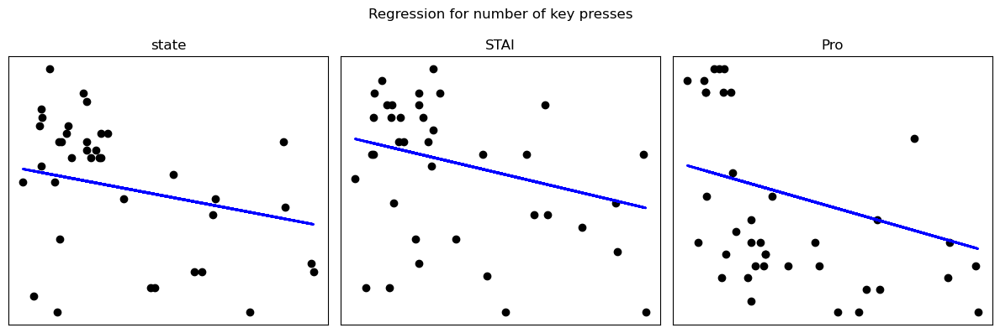

In [1857]:
feature_regression(tt_keyPress[train_indices].reshape(-1,1),y_train, y_stai[train_indices], y_pro[train_indices], \
    tt_keyPress[test_indices].reshape(-1,1),y_test,y_stai[test_indices], y_pro[test_indices],\
        'Regression for number of key presses')

MSE (state): 7.358638156363955
R^2 (state): 0.005688693282324908
MSE (STAI): 35.19216018066516
R^2 (STAI): -0.0842450084465316
MSE (Pro): 54.98586698805981
R^2 (Pro): -0.12770696413416593


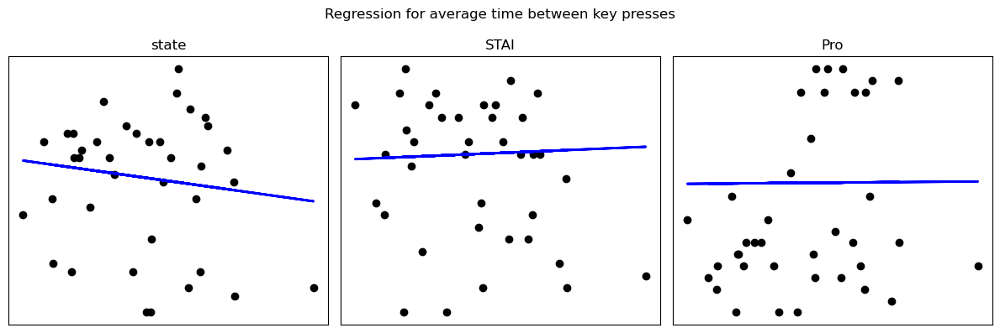

In [1858]:
feature_regression(tt_keyTime[train_indices].reshape(-1,1),y_train, y_stai[train_indices], y_pro[train_indices], \
    tt_keyTime[test_indices].reshape(-1,1),y_test,y_stai[test_indices], y_pro[test_indices],\
        'Regression for average time between key presses')

MSE (state): 6.988628420744935
R^2 (state): 0.05568501813265536
MSE (STAI): 34.97221597718859
R^2 (STAI): -0.07746868657450157
MSE (Pro): 57.08326939170448
R^2 (Pro): -0.17072265937991782


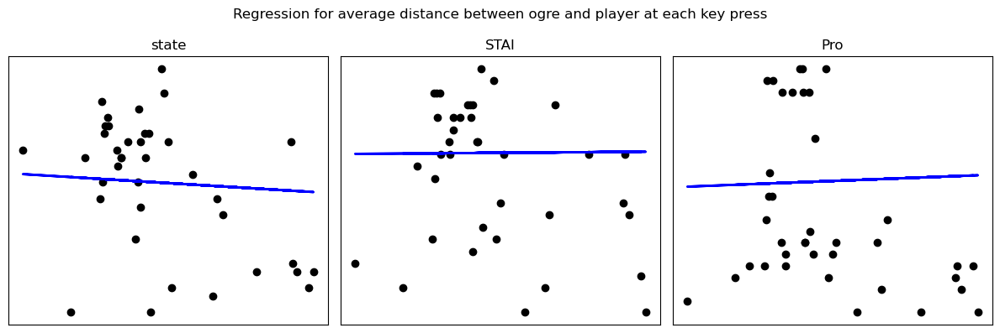

In [1859]:
feature_regression(tt_distance[train_indices].reshape(-1,1),y_train, y_stai[train_indices], y_pro[train_indices], \
    tt_distance[test_indices].reshape(-1,1),y_test,y_stai[test_indices], y_pro[test_indices],\
        'Regression for average distance between ogre and player at each key press')

MSE (state): 3.4692527053266793
R^2 (state): 0.531228860902209
MSE (STAI): 24.938747652072845
R^2 (STAI): 0.23165521752985585
MSE (Pro): 47.33847788850035
R^2 (Pro): 0.02913359176521846


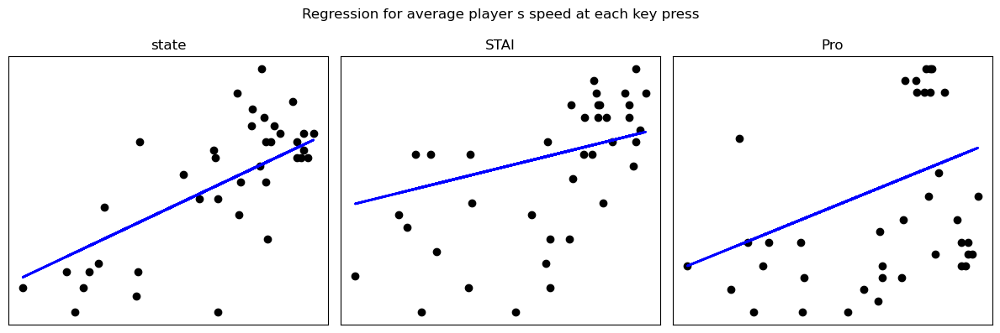

In [1860]:
feature_regression(tt_speed[train_indices].reshape(-1,1),y_train, y_stai[train_indices], y_pro[train_indices], \
    tt_speed[test_indices].reshape(-1,1),y_test,y_stai[test_indices], y_pro[test_indices],\
        'Regression for average player s speed at each key press')

MSE (state): 7.285297339624887
R^2 (state): 0.015598625225981988
MSE (STAI): 32.33226345023908
R^2 (STAI): 0.0038663418859965493
MSE (Pro): 32.57191518943472
R^2 (Pro): 0.33198151440825285


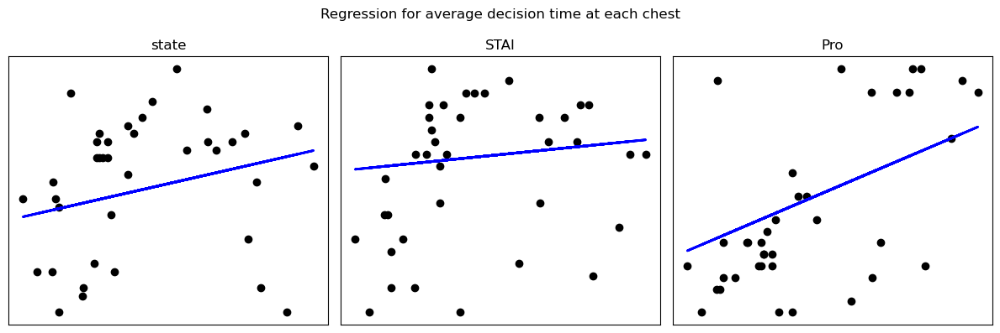

In [1861]:
feature_regression(tt_decisionTime[train_indices].reshape(-1,1),y_train, y_stai[train_indices], y_pro[train_indices], \
    tt_decisionTime[test_indices].reshape(-1,1),y_test,y_stai[test_indices], y_pro[test_indices],\
        'Regression for average decision time at each chest')

### 2. Regression over average of the whole data:

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest,  number of times the player is caught, and coins collected at each environment.

Similar to the above except the data is taken as average number over 4 different environments

In [1932]:
def data_regression(X_train, y_train, y_train_stai, y_train_pro, X_test, y_test, y_test_stai, y_test_pro, x_label):
    
    linear_reg_1 = linear_model.Ridge()
    linear_reg_1.fit(X_train,y_train)
    y_pred = linear_reg_1.predict(X_test)
    print(linear_reg_1.coef_)
    print('MSE (state): ' + str(metrics.mean_squared_error(y_test,y_pred)))
    print('R^2 (state): ' + str(metrics.r2_score(y_test,y_pred)))
    
    linear_reg_2 = linear_model.Ridge()
    linear_reg_2.fit(X_train,y_train_stai)
    y_pred_1 = linear_reg_2.predict(X_test)
    print(linear_reg_2.coef_)
    print('MSE (STAI): ' + str(metrics.mean_squared_error(y_test_stai,y_pred_1)))
    print('R^2 (STAI): ' + str(metrics.r2_score(y_test_stai,y_pred_1)))
    
    linear_reg_3 = linear_model.Ridge()
    linear_reg_3.fit(X_train,y_train_pro)
    y_pred_2 = linear_reg_3.predict(X_test)
    print(linear_reg_3.coef_)
    print('MSE (Pro): ' + str(metrics.mean_squared_error(y_test_pro,y_pred_2)))
    print('R^2 (Pro): ' + str(metrics.r2_score(y_test_pro,y_pred_2)))
    
    fig, ax = plt.subplots(3,1, figsize = (12,12))
    x = np.arange(X_train.shape[1])
    xmax = X_train.shape[1]
    
    ax[0].scatter(x,linear_reg_1.coef_,alpha = 0.8, linewidth = 1, marker = 'o', s = 30)
    ax[0].hlines(y=[0], xmin=[0], xmax=[xmax-1], colors='gray', linestyles='--', lw=2)
    ax[0].set_xticks(x)
    ax[0].set_xticklabels(x_label)
    ax[0].set_title('State anxiety scores')
    
    ax[1].scatter(x,linear_reg_2.coef_,alpha = 0.8, linewidth = 1, marker = 'o', s = 30)
    ax[1].hlines(y=[0], xmin=[0], xmax=[xmax-1], colors='gray', linestyles='--', lw=2)
    ax[1].set_xticks(x)
    ax[1].set_xticklabels(x_label)
    ax[1].set_title('STAI scores')
    
    ax[2].scatter(x,linear_reg_3.coef_,alpha = 0.8, linewidth = 1, marker = 'o', s = 30)
    ax[2].hlines(y=[0], xmin=[0], xmax=[xmax-1], colors='gray', linestyles='--', lw=2)
    ax[2].set_xticks(x)
    ax[2].set_title('PROMIS scores')
    ax[2].set_xticklabels(x_label)
    
    plt.suptitle('Visualization of Weight Values')
    fig.tight_layout()

[-0.69471768 -1.63306317 -0.20885197  2.47898693  2.45860727  1.55730887
  0.98453985  0.80954399 -0.12337707 -1.36577054]
MSE (state): 4.2351824140286745
R^2 (state): 0.4277351772435364
[-2.31302909  1.813819    4.11185586  0.98918567  1.81048372  3.45364707
  1.30409602  4.14452561 -1.84635956 -0.31383517]
MSE (STAI): 22.831192561544945
R^2 (STAI): 0.29658746593972785
[-2.20127475  2.00342451  7.04735912  1.10379972 10.68242809  6.05903445
  1.43729957  5.1800353   5.09039916 -0.1588565 ]
MSE (Pro): 27.94960488937265
R^2 (Pro): 0.4267806291862558


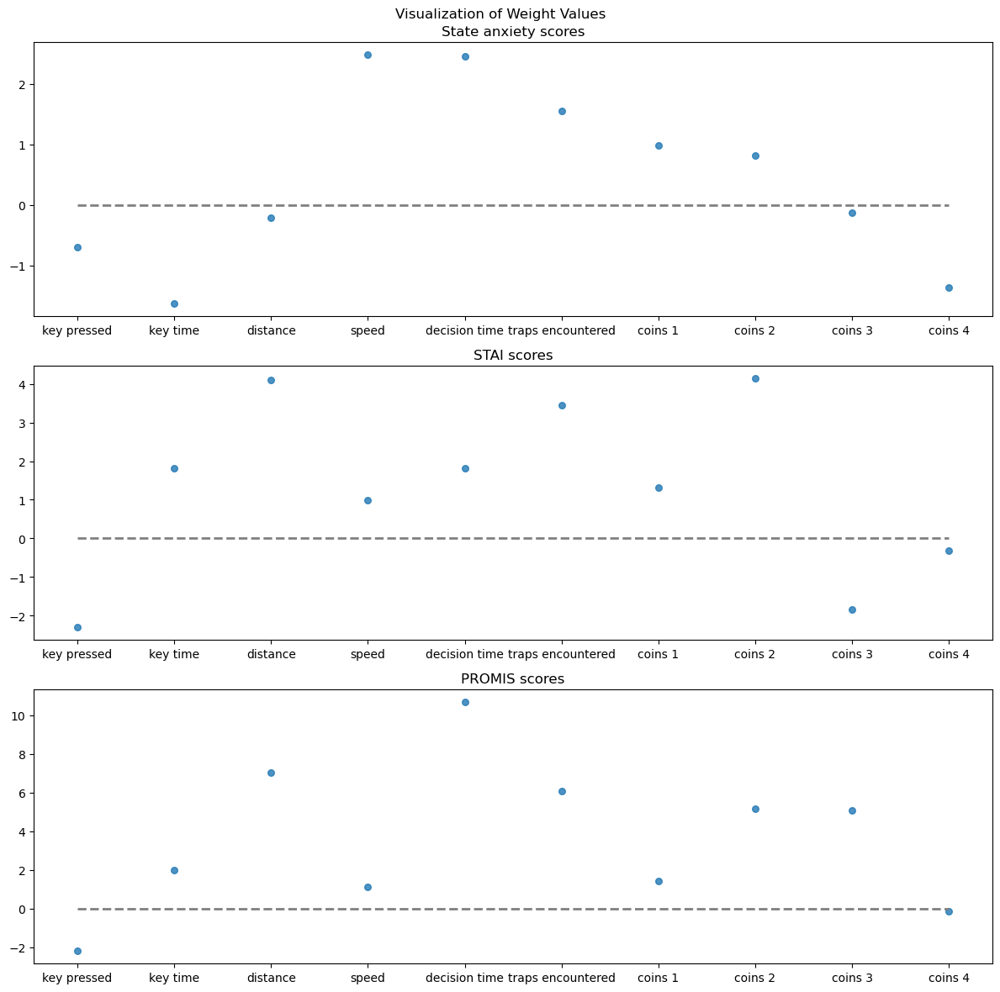

In [1933]:
data_regression(train_data_overall_2,y_train, y_stai[train_indices], y_pro[train_indices], \
    test_data_overall_2, y_test, y_stai[test_indices], y_pro[test_indices],\
        ['key pressed','key time','distance','speed','decision time','traps encountered','coins 1','coins 2','coins 3','coins 4'])

### 3. Regression over the data taken from right before the player ended their respective environment (timebin = 1 and 3):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest,  number of times the player is caught.



#### Timebins = 1

[-1.42545073 -2.02829956 -0.53734212  2.81679838  2.41276988  1.2142801 ]
MSE (state): 4.303863695346524
R^2 (state): 0.41845484939983935
[-2.62693265 -0.10547655  0.69938166  2.71158545 -0.25126498  2.71191182]
MSE (STAI): 23.685574427567865
R^2 (STAI): 0.2702645784333356
[ 0.16389561  1.18871819 -1.14087968  7.37572405  6.35773203  4.65735327]
MSE (Pro): 38.088888486888756
R^2 (Pro): 0.21883372663522094


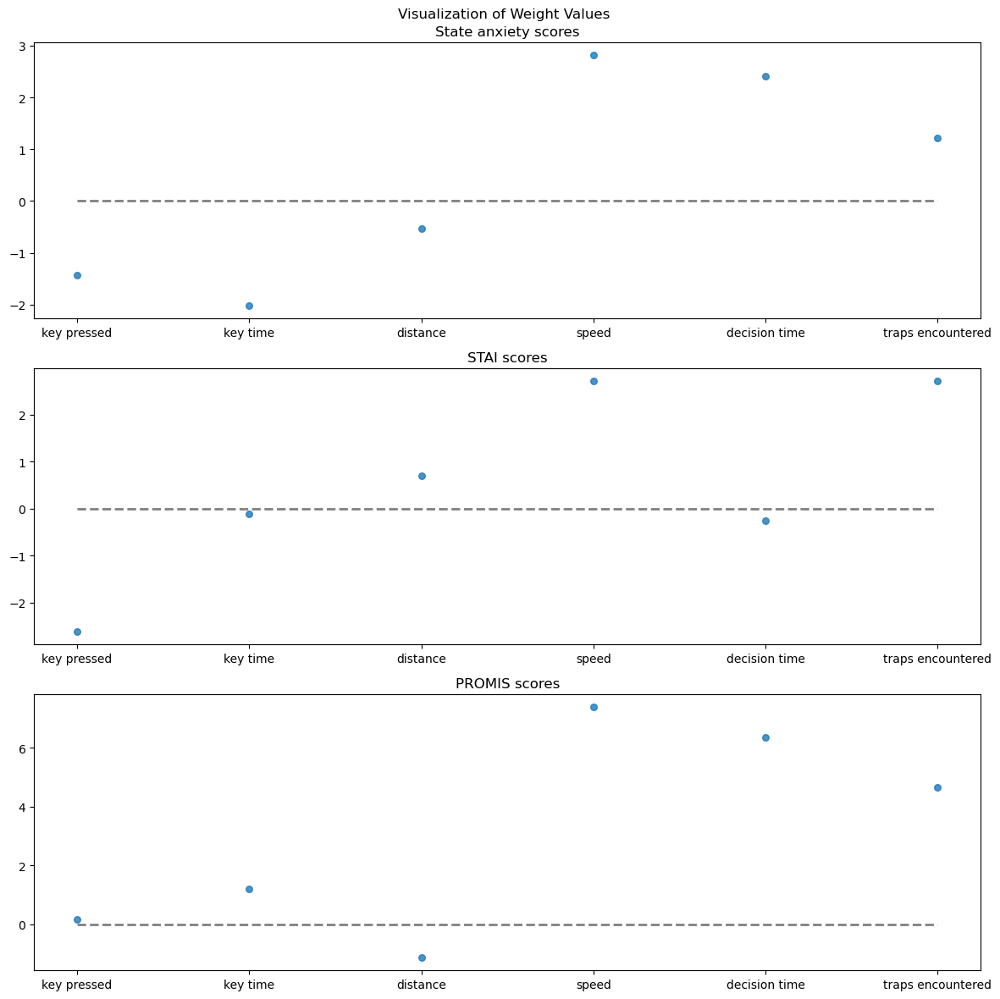

In [1936]:
data_regression(data_timebin_1_before_end[train_indices],y_train, y_stai[train_indices], y_pro[train_indices], \
    data_timebin_1_before_end[test_indices], y_test, y_stai[test_indices], y_pro[test_indices],\
        ['key pressed','key time','distance','speed','decision time','traps encountered'])

#### Timebins = 3

MSE (state): 4.074869217465221
R^2 (state): 0.4493969603849238
MSE (STAI): 37.05363563635179
R^2 (STAI): -0.14159572124201447
MSE (Pro): 29.641547352310898
R^2 (Pro): 0.39208052527075155


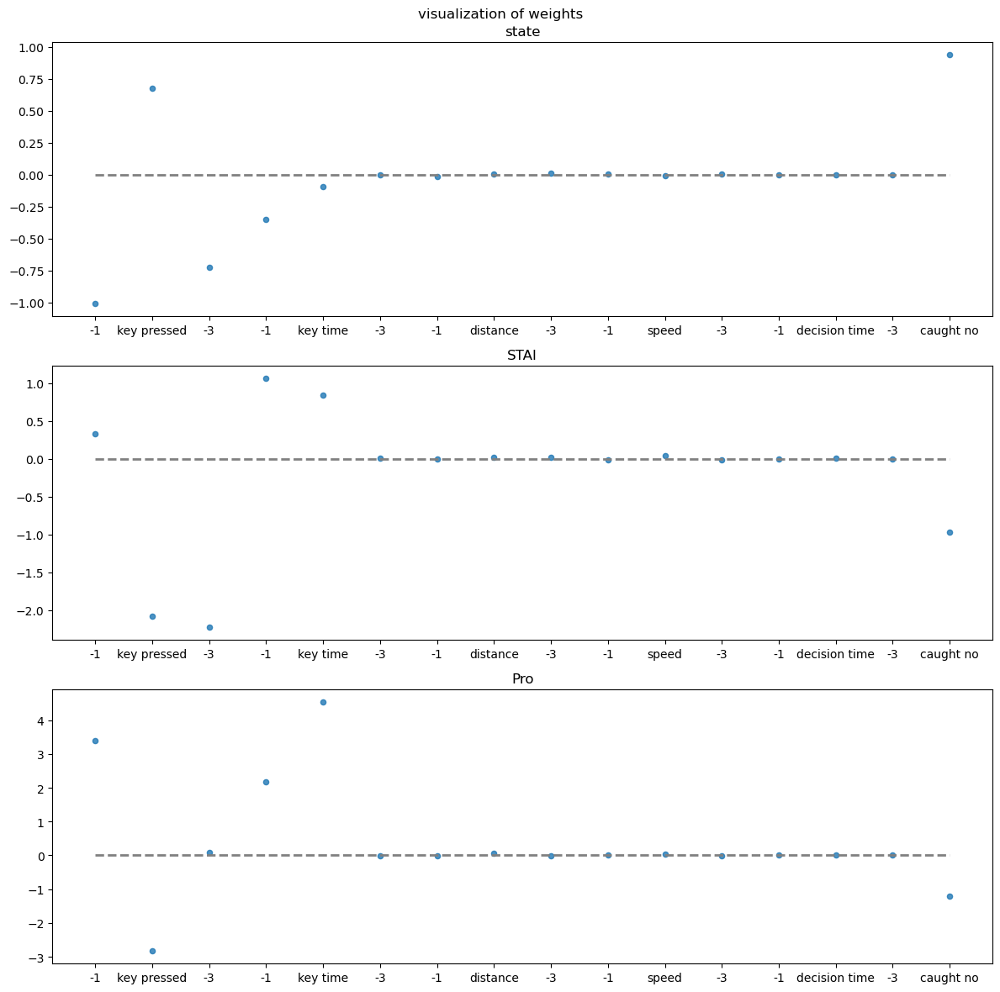

In [1865]:
data_regression(data_timebin_3_before_end[train_indices],y_train, y_stai[train_indices], y_pro[train_indices], \
    data_timebin_3_before_end[test_indices], y_test, y_stai[test_indices], y_pro[test_indices],\
        [-1,'key pressed',-3,-1,'key time',-3,-1,'distance',-3,-1,'speed',-3,-1,'decision time',-3,'caught no'])

### 4. Regression over the data taken from right before the player open the trap chests (timebin = 1 and 3):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest,  number of times the player is caught.

#### timebin = 1

[ 0.73141438 -1.82371864 -0.19766276  0.44478376 -1.09085534  3.23412232]
MSE (state): 4.263934364976786
R^2 (state): 0.42385016627949346
[ 0.81889384  0.7070823   5.6506816  -2.31697646  1.61096781  5.38446947]
MSE (STAI): 24.54729702086682
R^2 (STAI): 0.2437155284274961
[-3.98491961  0.49941979  5.08755935 -1.78071514  1.99748548  8.2653328 ]
MSE (Pro): 37.045037681824546
R^2 (Pro): 0.24024209731060908


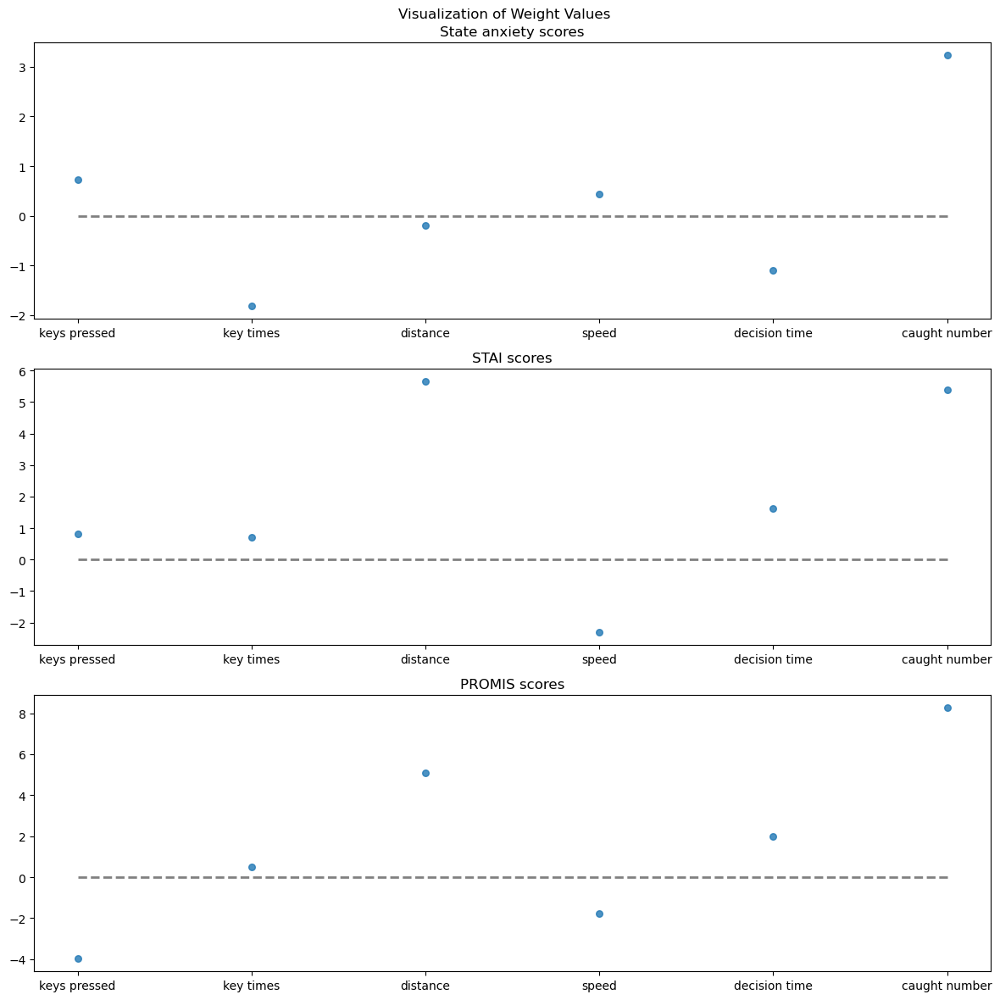

In [1934]:
data_regression(data_timebin_1_before[train_indices],y_train, y_stai[train_indices], y_pro[train_indices], \
    data_timebin_1_before[test_indices], y_test, y_stai[test_indices], y_pro[test_indices],\
        ['keys pressed', 'key times', 'distance', 'speed' , 'decision time', 'caught number'])

#### timebin = 3

MSE (state): 4.728170788620521
R^2 (state): 0.36112177616019636
MSE (STAI): 39.3633281934966
R^2 (STAI): -0.21275567883695157
MSE (Pro): 60.458573866107024
R^2 (Pro): -0.2399468904479396


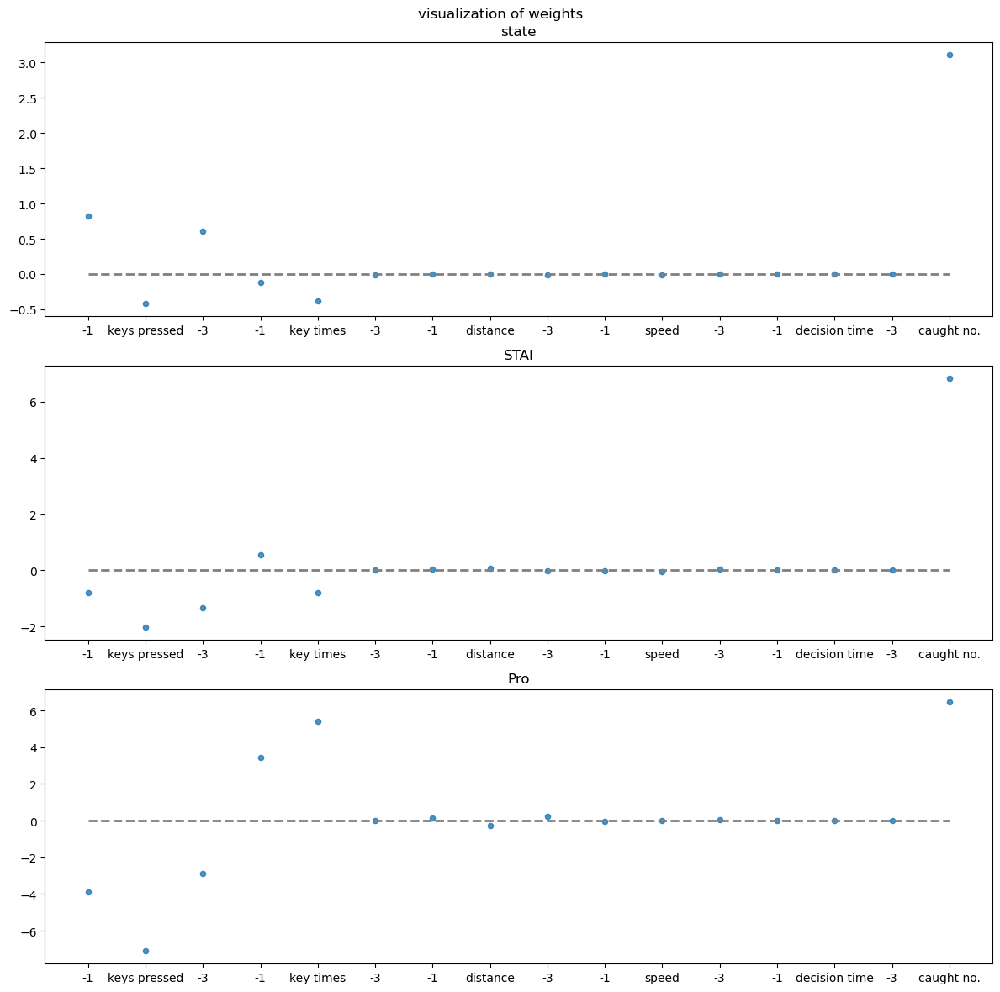

In [1867]:
data_regression(data_timebin_3_before[train_indices],y_train, y_stai[train_indices], y_pro[train_indices], \
    data_timebin_3_before[test_indices], y_test, y_stai[test_indices], y_pro[test_indices],\
        [-1,'keys pressed',-3,-1, 'key times',-3,-1, 'distance', -3,-1,'speed' ,-3,-1, 'decision time',-3, 'caught no.'])

### 5. Regression over the data taken from right after the player opened the trap chests (timebin = 1):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest,  number of times the player is caught.

[-0.23918388 -1.84884834  0.54620797  2.25463436  2.6888364   2.13158262]
MSE (state): 4.065516108316446
R^2 (state): 0.4506607678968544
[ 2.85760597  0.50871762  4.02733169 -1.98002519  3.56603035  4.13609564]
MSE (STAI): 22.03535959085509
R^2 (STAI): 0.321106504316398
[ 4.82490873 -0.94514048  0.42753079 -2.13314436  6.29445404  6.82246059]
MSE (Pro): 34.89743814844775
R^2 (Pro): 0.28428728714977647


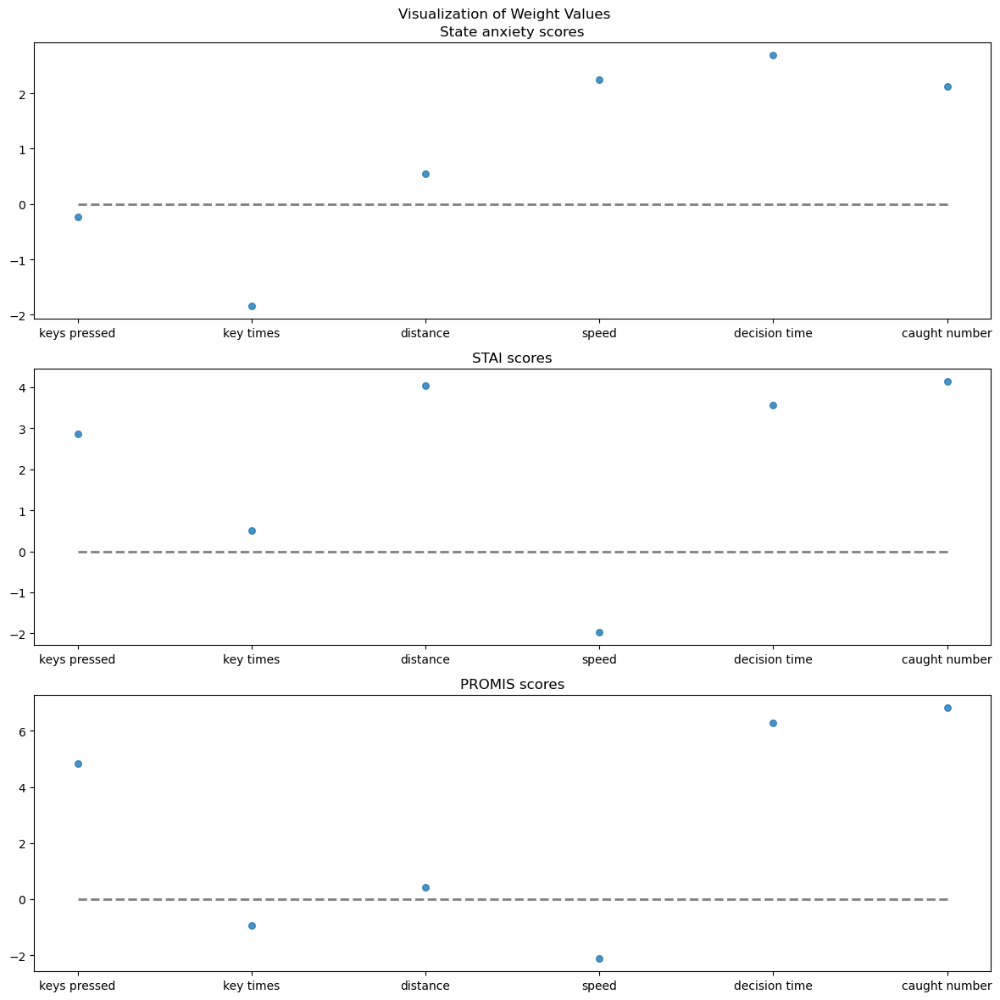

In [1937]:
data_regression(data_timebin_1_after[train_indices],y_train, y_stai[train_indices], y_pro[train_indices], \
    data_timebin_1_after[test_indices], y_test, y_stai[test_indices], y_pro[test_indices],\
        ['keys pressed', 'key times', 'distance', 'speed' , 'decision time', 'caught number'])

## Classification (linear classification and Gaussian Process classification)

In [1911]:
def RidgeClass(X_train, y_train, y_train_stai, y_train_pro, X_test, y_test, y_test_stai, y_test_pro):
    ridge_class_1 = linear_model.LogisticRegression()
    ridge_class_1.fit(X_train,y_train)
    y_pred_1 = ridge_class_1.predict(X_test)
    print('Prediction score(state) = ' + str(ridge_class_1.score(X_test,y_test)))
    
    ridge_class_2 = linear_model.LogisticRegression()
    ridge_class_2.fit(X_train,y_train_stai)
    y_pred_2 = ridge_class_2.predict(X_test)
    print('Prediction score(STAI) = ' + str(ridge_class_2.score(X_test,y_test_stai)))
    
    ridge_class_3 = linear_model.LogisticRegression()
    ridge_class_3.fit(X_train,y_train_pro)
    y_pred_3 = ridge_class_3.predict(X_test)
    print('Prediction score(Pro) = ' + str(ridge_class_3.score(X_test,y_test_pro)))
    
def GP_Class(X_train, y_train, y_train_stai, y_train_pro, X_test, y_test, y_test_stai, y_test_pro):
    kernel = 1 * RBF(length_scale=1.0)
    
    GPC_1 = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPC_1.fit(X_train,y_train)
    print('GP Prediction score(state) = ' + str(GPC_1.score(X_test,y_test)))
    
    GPC_2 = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPC_2.fit(X_train,y_train_stai)
    print('GP Prediction score(stai) = ' + str(GPC_2.score(X_test,y_test_stai)))
    
    GPC_3 = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPC_3.fit(X_train,y_train_pro)
    print('GP Prediction score(pro) = ' + str(GPC_3.score(X_test,y_test_pro)))
    

In [1870]:
y_norm_stai = normalization(y_stai)
y_norm_pro = normalization(y_pro)

### Classification over average of whole data

In [1912]:
RidgeClass(train_data_overall_2, anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    test_data_overall_2, anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.868421052631579
Prediction score(STAI) = 0.7368421052631579
Prediction score(Pro) = 0.7105263157894737


In [1872]:
GP_Class(GPR_data[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    GPR_data[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.8421052631578947
GP Prediction score(stai) = 0.5526315789473685
GP Prediction score(pro) = 0.7894736842105263


### Classification over data before the player skipped/ended their environments

#### timebin = 1

In [1913]:
RidgeClass(data_timebin_1_before_end[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    data_timebin_1_before_end[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.8947368421052632
Prediction score(STAI) = 0.6842105263157895
Prediction score(Pro) = 0.7105263157894737


In [1874]:
GP_Class(GPR_data_timebin_1_before_end[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    GPR_data_timebin_1_before_end[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.8157894736842105
GP Prediction score(stai) = 0.6052631578947368
GP Prediction score(pro) = 0.7368421052631579


#### timebin = 3

In [1875]:
RidgeClass(data_timebin_3_before_end[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    data_timebin_3_before_end[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.8157894736842105
Prediction score(STAI) = 0.39473684210526316
Prediction score(Pro) = 0.7631578947368421


c:\Users\Nguye\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Nguye\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

### Classification over data before the player encountered the trap chests

#### timebin = 1

In [1876]:
RidgeClass(data_timebin_1_before[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    data_timebin_1_before[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.8157894736842105
Prediction score(STAI) = 0.7105263157894737
Prediction score(Pro) = 0.6842105263157895


In [1877]:
GP_Class(GPR_data_timebin_1_before[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    GPR_data_timebin_1_before[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.8421052631578947
GP Prediction score(stai) = 0.631578947368421
GP Prediction score(pro) = 0.7631578947368421


##### timebin = 3

In [1878]:
RidgeClass(data_timebin_3_before[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    data_timebin_3_before[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

c:\Users\Nguye\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Prediction score(state) = 0.868421052631579
Prediction score(STAI) = 0.47368421052631576
Prediction score(Pro) = 0.7368421052631579


c:\Users\Nguye\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Nguye\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

### Classification over data right after the player encountered the trap chests

In [1914]:
RidgeClass(GPR_data_timebin_1_after[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    GPR_data_timebin_1_after[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.8421052631578947
Prediction score(STAI) = 0.7105263157894737
Prediction score(Pro) = 0.6842105263157895


In [1880]:
GP_Class(GPR_data_timebin_1_after[train_indices], anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    GPR_data_timebin_1_after[test_indices], anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.868421052631579
GP Prediction score(stai) = 0.6842105263157895
GP Prediction score(pro) = 0.7894736842105263


### Classification for individual features 

#### Key presses

In [1915]:
RidgeClass(tt_keyPress[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    tt_keyPress[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.7894736842105263
Prediction score(STAI) = 0.7105263157894737
Prediction score(Pro) = 0.631578947368421


In [1882]:
GP_Class(normalization(tt_keyPress)[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    normalization(tt_keyPress)[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.8421052631578947
GP Prediction score(stai) = 0.6578947368421053
GP Prediction score(pro) = 0.5


#### Key time 

In [1916]:
RidgeClass(tt_keyTime[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    tt_keyTime[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.6578947368421053
Prediction score(STAI) = 0.6052631578947368
Prediction score(Pro) = 0.34210526315789475


In [1884]:
GP_Class(normalization(tt_keyTime)[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    normalization(tt_keyTime)[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.5789473684210527
GP Prediction score(stai) = 0.6052631578947368
GP Prediction score(pro) = 0.7105263157894737


#### Distance

In [1917]:
RidgeClass(tt_distance[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    tt_distance[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.7105263157894737
Prediction score(STAI) = 0.6052631578947368
Prediction score(Pro) = 0.34210526315789475


In [1886]:
GP_Class(normalization(tt_distance)[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    normalization(tt_distance)[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.7631578947368421
GP Prediction score(stai) = 0.7368421052631579
GP Prediction score(pro) = 0.6842105263157895


#### Speed

In [1918]:
RidgeClass(tt_speed[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    tt_speed[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.8157894736842105
Prediction score(STAI) = 0.6052631578947368
Prediction score(Pro) = 0.34210526315789475


In [1910]:
GP_Class(normalization(tt_speed)[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    normalization(tt_speed)[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.8421052631578947
GP Prediction score(stai) = 0.7105263157894737
GP Prediction score(pro) = 0.6842105263157895


#### Decision Time

In [1919]:
RidgeClass(tt_decisionTime[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    tt_decisionTime[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

Prediction score(state) = 0.7368421052631579
Prediction score(STAI) = 0.6052631578947368
Prediction score(Pro) = 0.7894736842105263


In [1890]:
GP_Class(normalization(tt_decisionTime)[train_indices].reshape(-1,1), anx_label[train_indices], anx_label_stai[train_indices], anx_label_pro[train_indices],\
    normalization(tt_decisionTime)[test_indices].reshape(-1,1), anx_label[test_indices], anx_label_stai[test_indices], anx_label_pro[test_indices])

GP Prediction score(state) = 0.631578947368421
GP Prediction score(stai) = 0.6578947368421053
GP Prediction score(pro) = 0.7894736842105263


## Gaussian Process Regressions

In [1891]:
def GP_Reg(X_train, y_train, y_train_stai, y_train_pro, X_test, y_test, y_test_stai, y_test_pro):
    kernel = 1 * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
    
    GPR_1 = GaussianProcessRegressor(kernel = kernel, random_state=0)
    GPR_1.fit(X_train,y_train)
    y_GPR_1, std_1 = GPR_1.predict(X_test, return_std = True)
    print('State')
    print('MSE = '+ str(metrics.mean_squared_error(y_test,y_GPR_1)))
    print('Log marginal likelihood = ' + str(GPR_1.log_marginal_likelihood()))  
    
    GPR_2 = GaussianProcessRegressor(kernel=kernel, random_state=0)
    GPR_2.fit(X_train,y_train_stai)
    y_GPR_2, std_2 = GPR_2.predict(X_test, return_std = True)
    print('STAI')
    print('MSE = '+ str(metrics.mean_squared_error(y_test_stai,y_GPR_2)))
    print('Log marginal likelihood = ' + str(GPR_2.log_marginal_likelihood()))  
    
    GPR_3 = GaussianProcessRegressor(kernel=kernel, random_state=0)
    GPR_3.fit(X_train,y_train_pro)
    y_GPR_3, std_3 = GPR_3.predict(X_test, return_std = True)
    print('PRO')
    print('MSE = '+ str(metrics.mean_squared_error(y_test_pro,y_GPR_3)))
    print('Log marginal likelihood = ' + str(GPR_3.log_marginal_likelihood()))  

### 1. GPR data taken from right after the player open the trap chests (timebin = 1):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest.

There might be errors with this as the log marginal likelihook is too negative

In [1892]:
GP_Reg(GPR_data_timebin_1_after[train_indices], y_norm_train, y_norm_stai[train_indices], y_norm_pro[train_indices],\
    GPR_data_timebin_1_after[test_indices], y_norm_test, y_norm_stai[test_indices], y_norm_pro[test_indices])

State
MSE = 35.35021811577123
Log marginal likelihood = -179.6069365843029
STAI
MSE = 0.9940331460407655
Log marginal likelihood = -66.6599231629345
PRO
MSE = 0.6301231328779998
Log marginal likelihood = -67.42223664590512


### 2. GPR data taken from right before the player opened the trap chests (timebin = 1):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest.

In [1893]:
GP_Reg(GPR_data_timebin_1_before[train_indices], y_norm_train, y_norm_stai[train_indices], y_norm_pro[train_indices],\
    GPR_data_timebin_1_before[test_indices], y_norm_test, y_norm_stai[test_indices], y_norm_pro[test_indices])


State
MSE = 35.44736509345623
Log marginal likelihood = -179.60707321483346
STAI
MSE = 1.1273734427069861
Log marginal likelihood = -67.50503814129188
PRO
MSE = 0.603688242946502
Log marginal likelihood = -63.94764973462431


### 3. GPR data taken from right before the player skipped/ended their environments (timebin = 1):

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest.

In [1894]:
GP_Reg(GPR_data_timebin_1_before_end[train_indices], y_norm_train, y_norm_stai[train_indices], y_norm_pro[train_indices],\
    GPR_data_timebin_1_before_end[test_indices], y_norm_test, y_norm_stai[test_indices], y_norm_pro[test_indices])


State
MSE = 35.28654691818059
Log marginal likelihood = -179.6070731454401
STAI
MSE = 1.2451349625868238
Log marginal likelihood = -68.89089640332568
PRO
MSE = 0.9618682267738365
Log marginal likelihood = -80.17528814820537


### 4. GPR data taken from average over the whole data:

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest.

In [1895]:
GP_Reg(GPR_data[train_indices], y_norm_train, y_norm_stai[train_indices], y_norm_pro[train_indices],\
    GPR_data[test_indices], y_norm_test, y_norm_stai[test_indices], y_norm_pro[test_indices])

State
MSE = 35.24272945174169
Log marginal likelihood = -179.60691673947684
STAI
MSE = 1.174564636908861
Log marginal likelihood = -71.90293304476256
PRO
MSE = 0.6252388851924483
Log marginal likelihood = -62.82832711570321


# Plots for raw data visualization

In [1896]:
timeBetweenChest[timeBetweenChest==0] = np.nan
decisionTime[decisionTime==0] = np.nan
keyPresses[keyPresses==0] = np.nan
averageKeyTime[averageKeyTime==0.0] = np.nan
averageSpeed[averageSpeed==0.0] = np.nan
averageDistance[averageDistance==0.0] = np.nan
chestOpen[chestOpen==0] = np.nan
totalTime[totalTime==0] = np.nan
totalCoins[totalCoins==0] = np.nan
decisionTime[decisionTime>=5000] = np.nan

In [1897]:
def plot_data(data, anx, not_anxious, anx_stai, not_anxious_stai, anx_pro,not_anxious_pro):
    mask = (data!=0)
    return (np.sum(data[anx], axis = 0)/np.sum(mask[anx], axis = 0),
    np.sum(data[not_anxious], axis = 0)/np.sum(mask[not_anxious], axis = 0),
    np.sum(data[anx_stai], axis = 0)/np.sum(mask[anx_stai], axis = 0),
    np.sum(data[not_anxious_stai], axis = 0)/np.sum(mask[not_anxious_stai], axis = 0),
    np.sum(data[anx_pro], axis = 0)/np.sum(mask[anx_pro], axis = 0),
    np.sum(data[not_anxious_pro], axis = 0)/np.sum(mask[not_anxious_pro], axis = 0))

In [1898]:
plot_keypress = np.zeros(shape = (6,100), dtype = float)
plot_keytime = np.zeros(shape = (6,100), dtype = float)
plot_distance = np.zeros(shape = (6,100), dtype = float)
plot_speed = np.zeros(shape = (6,100), dtype = float)
plot_decitionTime = np.zeros(shape = (6,100), dtype = float)

plot_keypress = plot_data(keyPress_flatten, anxious, not_anxious, anxious_stai, not_anxious_stai, anxious_pro, not_anxious_pro)
plot_keytime = plot_data(avg_keyTimes_flatten, anxious, not_anxious, anxious_stai, not_anxious_stai, anxious_pro, not_anxious_pro)
plot_distance = plot_data(avg_distance_flatten, anxious, not_anxious, anxious_stai, not_anxious_stai, anxious_pro, not_anxious_pro)
plot_speed = plot_data(avg_speed_flatten, anxious, not_anxious, anxious_stai, not_anxious_stai, anxious_pro, not_anxious_pro)
plot_decitionTime = plot_data(avg_decisionTime_flatten, anxious, not_anxious, anxious_stai, not_anxious_stai, anxious_pro, not_anxious_pro)

C:\Users\Nguye\AppData\Local\Temp\ipykernel_24560\119146415.py:3: RuntimeWarning: invalid value encountered in divide
  return (np.sum(data[anx], axis = 0)/np.sum(mask[anx], axis = 0),
C:\Users\Nguye\AppData\Local\Temp\ipykernel_24560\119146415.py:4: RuntimeWarning: invalid value encountered in divide
  np.sum(data[not_anxious], axis = 0)/np.sum(mask[not_anxious], axis = 0),
C:\Users\Nguye\AppData\Local\Temp\ipykernel_24560\119146415.py:5: RuntimeWarning: invalid value encountered in divide
  np.sum(data[anx_stai], axis = 0)/np.sum(mask[anx_stai], axis = 0),
C:\Users\Nguye\AppData\Local\Temp\ipykernel_24560\119146415.py:6: RuntimeWarning: invalid value encountered in divide
  np.sum(data[not_anxious_stai], axis = 0)/np.sum(mask[not_anxious_stai], axis = 0),
C:\Users\Nguye\AppData\Local\Temp\ipykernel_24560\119146415.py:7: RuntimeWarning: invalid value encountered in divide
  np.sum(data[anx_pro], axis = 0)/np.sum(mask[anx_pro], axis = 0),
C:\Users\Nguye\AppData\Local\Temp\ipykernel_245

In [1899]:
data_length

94

In [1434]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2144]:
y = min_max_scaling(y)
y_stai = min_max_scaling(y_stai)
y_pro = min_max_scaling(y_pro)

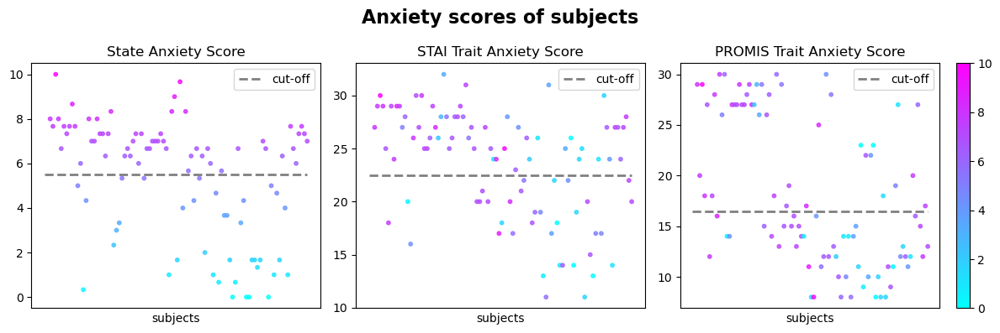

In [1436]:
fig, ax = plt.subplots(1,3,figsize = (12,4))

x = np.arange(data_length) + 1
ax[0].scatter(x, colors, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
ax[1].scatter(x, STAI, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
ax[2].scatter(x, pro_anxiety, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
ax[0].set_title('State Anxiety Score')
ax[0].set_xticks([])
ax[0].set_xlabel('subjects')
ax[0].hlines(y=[5.5], xmin=[-1], xmax=[data_length], colors='gray', linestyles='--', lw=2, label = 'cut-off')
ax[1].set_title('STAI Trait Anxiety Score')
ax[1].set_xlabel('subjects')
ax[1].set_xticks([])
ax[1].hlines(y=[22.5], xmin=[-1], xmax=[data_length], colors='gray', linestyles='--', lw=2, label = 'cut-off')
ax[2].set_title('PROMIS Trait Anxiety Score')
ax[2].set_xlabel('subjects')
ax[2].set_xticks([])
ax[2].hlines(y=[16.5], xmin=[-1], xmax=[data_length], colors='gray', linestyles='--', lw=2, label = 'cut-off')
ax[0].legend()
ax[1].legend()
ax[2].legend()
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size="5%", pad=0.2,)
fig.colorbar(cm.ScalarMappable(norm=cl.Normalize(0,10), cmap=cm.cool), cax = cax)
fig.suptitle('Anxiety scores of subjects', size = 16, weight = 'bold')
fig.tight_layout()

In [1511]:
diff_anx = current_anxiety[:,2]-current_anxiety[:,0]

In [1514]:
print(np.mean(diff_anx[np.where(diff_anx>0)]))
print(np.std(diff_anx[np.where(diff_anx>0)]))

1.6956521739130435
0.8564224175474873


In [1513]:
print(np.mean(diff_anx[np.where(diff_anx<0)]))
print(np.std(diff_anx[np.where(diff_anx<0)]))

-1.5416666666666667
1.0793194872490515


In [1510]:
print(np.where((current_anxiety[:,2]-current_anxiety[:,0])>0)[0].shape)
print(np.where((current_anxiety[:,2]-current_anxiety[:,0])==0)[0].shape)

(46,)
(24,)


In [2126]:
x_1 = np.where(~np.isnan(state_anxiety_summary[:,2]))

In [2154]:
np.mean(anxiety_diff,axis=0)

array([0.50549451, 0.01098901])

In [2157]:
print(np.sum(anxiety_diff[:,0]>0))
print(np.sum(anxiety_diff[:,0]<0))

36
18


In [2158]:
print(np.sum(anxiety_diff[:,1]>0))
print(np.sum(anxiety_diff[:,1]<0))

29
28


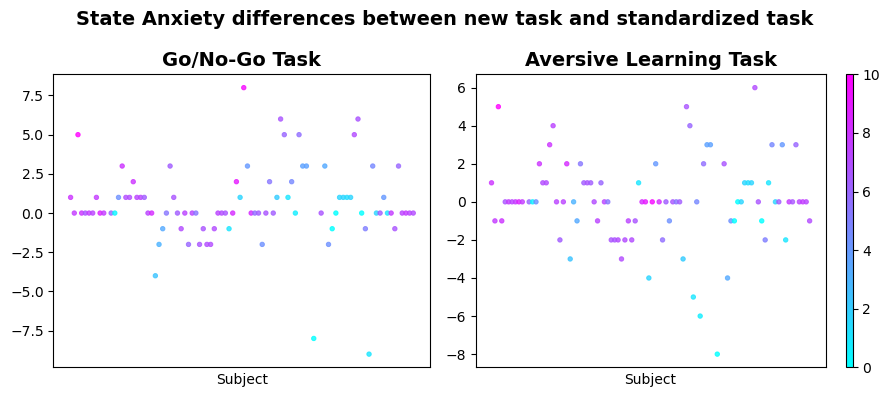

In [2152]:
fig_20, ax_20 = plt.subplots(1,2, figsize = (9,4))

ax_20[0].scatter(x_1,anxiety_diff[:,0], alpha = 0.8, linewidth = 0.7, marker = 'o', s = 10, color = cm.cool(y[x_1]))
ax_20[0].set_title('Go/No-Go Task',size = 14, weight = 'bold')
ax_20[0].set_xticks([])
ax_20[0].set_xlabel("Subject")

ax_20[1].scatter(x_1,anxiety_diff[:,1], alpha = 0.8, linewidth = 0.7, marker = 'o', s = 10, color = cm.cool(y[x_1]))
ax_20[1].set_title('Aversive Learning Task',size = 14, weight = 'bold')
ax_20[1].set_xticks([])
ax_20[1].set_xlabel("Subject")
fig_20.suptitle('State Anxiety differences between new task and standardized task', size = 14, weight = 'bold')
divider = make_axes_locatable(ax_20[1])
cax = divider.append_axes('right', size="2%", pad=0.2,)
fig_20.colorbar(cm.ScalarMappable(norm=cl.Normalize(0,10), cmap=cm.cool), cax = cax)
fig_20.tight_layout()

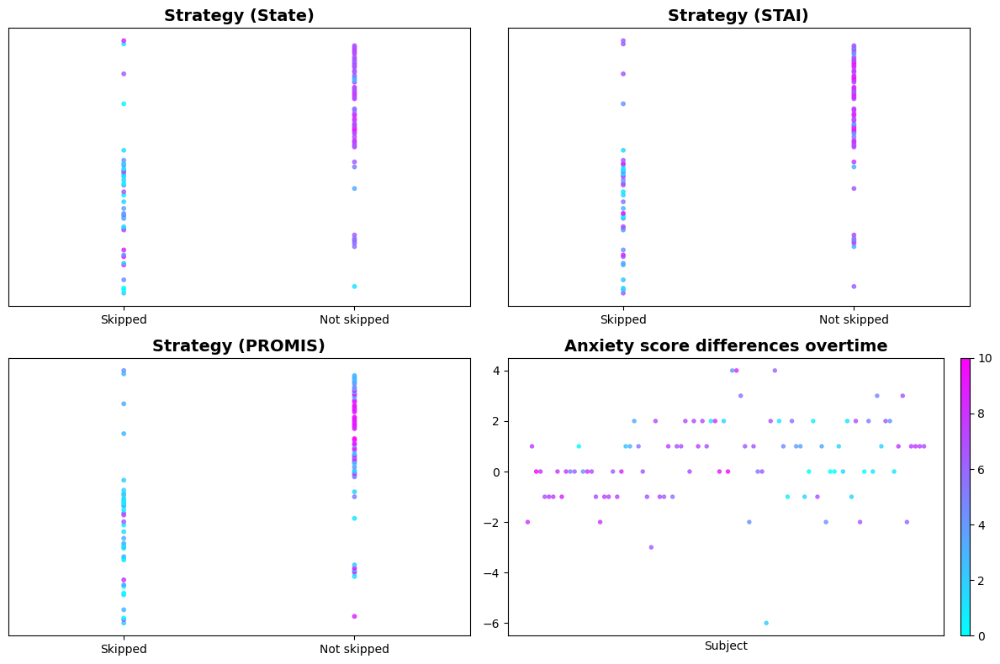

In [1438]:
figure, axes = plt.subplots(2,2, figsize=(12, 8))

axes[0,0].scatter(not_skipping,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
axes[0,0].set_title('Strategy (State)', size = 14, weight = 'bold')
axes[0,0].set_yticks([])
axes[0,0].set_xlim(-0.5,1.5)
axes[0,0].set_xticks([0,1])
axes[0,0].set_xticklabels(['Skipped','Not skipped'])

axes[0,1].scatter(not_skipping,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_stai))
axes[0,1].set_title('Strategy (STAI)', size = 14, weight = 'bold')
axes[0,1].set_yticks([])
axes[0,1].set_xlim(-0.5,1.5)
axes[0,1].set_xticks([0,1])
axes[0,1].set_xticklabels(['Skipped','Not skipped'])

axes[1,0].scatter(not_skipping,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_pro))
axes[1,0].set_title('Strategy (PROMIS)', size = 14, weight = 'bold')
axes[1,0].set_yticks([])
axes[1,0].set_xlim(-0.5,1.5)
axes[1,0].set_xticks([0,1])
axes[1,0].set_xticklabels(['Skipped','Not skipped'])


axes[1,1].scatter(x,current_anxiety[:,2]-current_anxiety[:,0], alpha = 0.8, linewidth = 0.7, marker = 'o', s = 10, color = cm.cool(y))
axes[1,1].set_title('Anxiety score differences overtime',size = 14, weight = 'bold')
axes[1,1].set_xticks([])
axes[1,1].set_xlabel("Subject")

divider = make_axes_locatable(axes[1,1])
cax = divider.append_axes('right', size="2%", pad=0.2,)
figure.colorbar(cm.ScalarMappable(norm=cl.Normalize(0,10), cmap=cm.cool), cax = cax)
figure.tight_layout()

In [1485]:
def plot_raw_data(y1,y2,y3, x, xlabel, title):
    fig,ax = plt.subplots(1,3,figsize = (13,4))
    ax[0].scatter(x,y1, alpha = 0.6, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
    ax[0].set_xlabel(xlabel)
    ax[0].set_ylabel('State Anxiety Score')
    ax[1].scatter(x,y2, alpha = 0.6, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_stai))
    ax[1].set_xlabel(xlabel)
    ax[1].set_ylabel('STAI Anxiety Score')
    ax[2].scatter(x,y3, alpha = 0.6, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_pro))
    ax[2].set_xlabel(xlabel)
    ax[2].set_ylabel('PROMIS Anxiety Score')
    divider = make_axes_locatable(ax[2])
    cax = divider.append_axes('right', size="2%", pad=0.2,)
    figure.colorbar(cm.ScalarMappable(norm=cl.Normalize(0,1), cmap=cm.cool), cax = cax)
    fig.suptitle(title)
    fig.tight_layout()

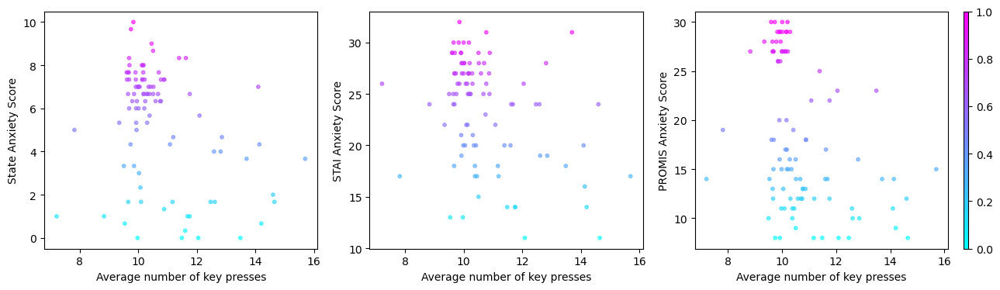

In [1486]:
plot_raw_data(colors, STAI, pro_anxiety, tt_keyPress, 'Average number of key presses', '')

In [1497]:
print(np.mean(tt_keyPress[anxious]))
print(np.std(tt_keyPress[anxious]))
print(np.mean(tt_keyPress[anxious_stai]))
print(np.std(tt_keyPress[anxious_stai]))
print(np.mean(tt_keyPress[anxious_pro]))
print(np.std(tt_keyPress[anxious_pro]))

10.30747771941261
0.7256383035551083
10.387684587476853
1.115532039269088
10.177362284565284
0.872628936071378


In [1496]:
print(np.mean(tt_keyPress[not_anxious]))
print(np.std(tt_keyPress[not_anxious]))
print(np.mean(tt_keyPress[not_anxious_stai]))
print(np.std(tt_keyPress[not_anxious_stai]))
print(np.mean(tt_keyPress[not_anxious_pro]))
print(np.std(tt_keyPress[not_anxious_pro]))

11.43980554986632
1.9936302466773055
11.272247462830775
1.7233243136589564
11.19196222678678
1.6550290985289506


In [1475]:
np.where(((colors>5)==True) & ((STAI>22)==True))[0].shape

(42,)

In [1477]:
np.where(((STAI>22)==True))[0].shape

(59,)

In [1478]:
np.where(((pro_anxiety>16)==True))[0].shape

(44,)

In [1476]:
np.where(((colors>5)==True) & ((pro_anxiety>16)==True))[0].shape

(33,)

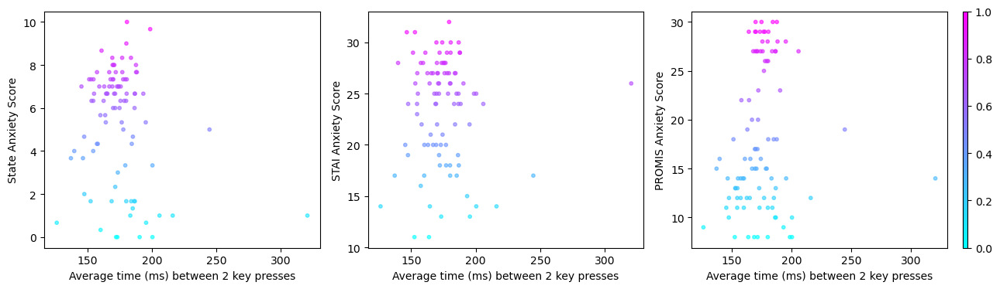

In [1498]:
plot_raw_data(colors, STAI, pro_anxiety, tt_keyTime, 'Average time (ms) between 2 key presses', '')

In [1499]:
print(np.mean(tt_keyTime[anxious]))
print(np.std(tt_keyTime[anxious]))
print(np.mean(tt_keyTime[anxious_stai]))
print(np.std(tt_keyTime[anxious_stai]))
print(np.mean(tt_keyTime[anxious_pro]))
print(np.std(tt_keyTime[anxious_pro]))

171.89321741541616
11.374361618777769
175.1400464494719
23.431480585259557
177.8482562180936
14.176545233906698


In [1500]:
print(np.mean(tt_keyTime[not_anxious]))
print(np.std(tt_keyTime[not_anxious]))
print(np.mean(tt_keyTime[not_anxious_stai]))
print(np.std(tt_keyTime[not_anxious_stai]))
print(np.mean(tt_keyTime[not_anxious_pro]))
print(np.std(tt_keyTime[not_anxious_pro]))

179.2629230603664
34.24745318862018
173.57913395595966
21.62862601414392
171.66418310762617
27.957660672923556


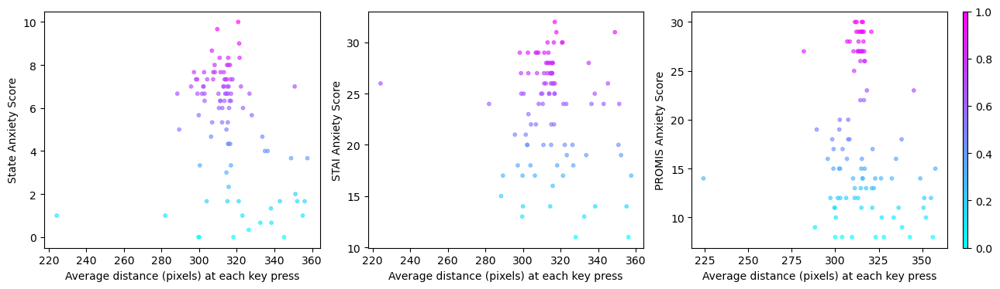

In [1503]:
plot_raw_data(colors, STAI, pro_anxiety, tt_distance, 'Average distance (pixels) at each key press', '')

In [1504]:
print(np.mean(tt_distance[anxious]))
print(np.std(tt_distance[anxious]))
print(np.mean(tt_distance[anxious_stai]))
print(np.std(tt_distance[anxious_stai]))
print(np.mean(tt_distance[anxious_pro]))
print(np.std(tt_distance[anxious_pro]))

311.7004844933682
9.29419535869819
313.8360864585203
16.903189119563258
312.4767745241392
9.922757350546972


In [1505]:
print(np.mean(tt_distance[not_anxious]))
print(np.std(tt_distance[not_anxious]))
print(np.mean(tt_distance[not_anxious_stai]))
print(np.std(tt_distance[not_anxious_stai]))
print(np.mean(tt_distance[not_anxious_pro]))
print(np.std(tt_distance[not_anxious_pro]))

321.8121511878415
25.863987322360103
317.9232316838859
19.214363853291605
317.89328261853154
22.417447645593086


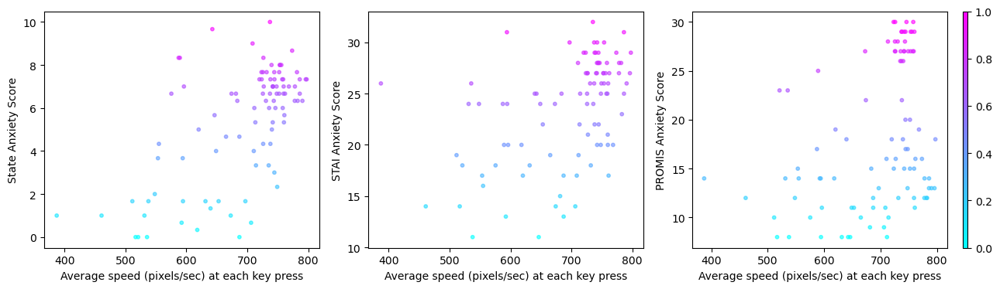

In [1502]:
plot_raw_data(colors, STAI, pro_anxiety, tt_speed, 'Average speed (pixels/sec) at each key press', '')

In [1506]:
print(np.mean(tt_speed[anxious]))
print(np.std(tt_speed[anxious]))
print(np.mean(tt_speed[anxious_stai]))
print(np.std(tt_speed[anxious_stai]))
print(np.mean(tt_speed[anxious_pro]))
print(np.std(tt_speed[anxious_pro]))

732.2858020744698
49.96895299031362
716.4024949138319
76.41443167387067
718.0434039775237
59.70861556741996


In [1507]:
print(np.mean(tt_speed[not_anxious]))
print(np.std(tt_speed[not_anxious]))
print(np.mean(tt_speed[not_anxious_stai]))
print(np.std(tt_speed[not_anxious_stai]))
print(np.mean(tt_speed[not_anxious_pro]))
print(np.std(tt_speed[not_anxious_pro]))

624.1691927946734
90.89456985417735
654.0329565591715
85.26104028930173
671.2998180895208
97.61082265175129


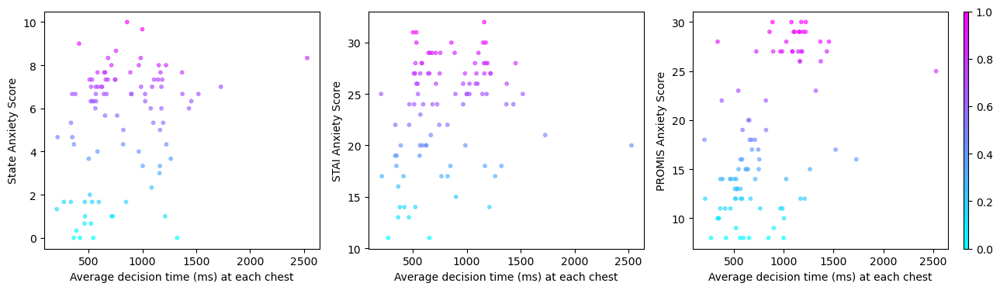

In [1501]:
plot_raw_data(colors, STAI, pro_anxiety,tt_decisionTime, 'Average decision time (ms) at each chest', '')

In [1508]:
print(np.mean(tt_decisionTime[anxious]))
print(np.std(tt_decisionTime[anxious]))
print(np.mean(tt_decisionTime[anxious_stai]))
print(np.std(tt_decisionTime[anxious_stai]))
print(np.mean(tt_decisionTime[anxious_pro]))
print(np.std(tt_decisionTime[anxious_pro]))

884.7366640653262
385.2137252966496
875.3314114278882
306.8630299464013
1005.5090796898418
384.3173177213498


In [1509]:
print(np.mean(tt_decisionTime[not_anxious]))
print(np.std(tt_decisionTime[not_anxious]))
print(np.mean(tt_decisionTime[not_anxious_stai]))
print(np.std(tt_decisionTime[not_anxious_stai]))
print(np.mean(tt_decisionTime[not_anxious_pro]))
print(np.std(tt_decisionTime[not_anxious_pro]))

694.2720274480251
338.9125318674787
715.5684429402008
462.277279052189
648.940985415988
287.10732991563833


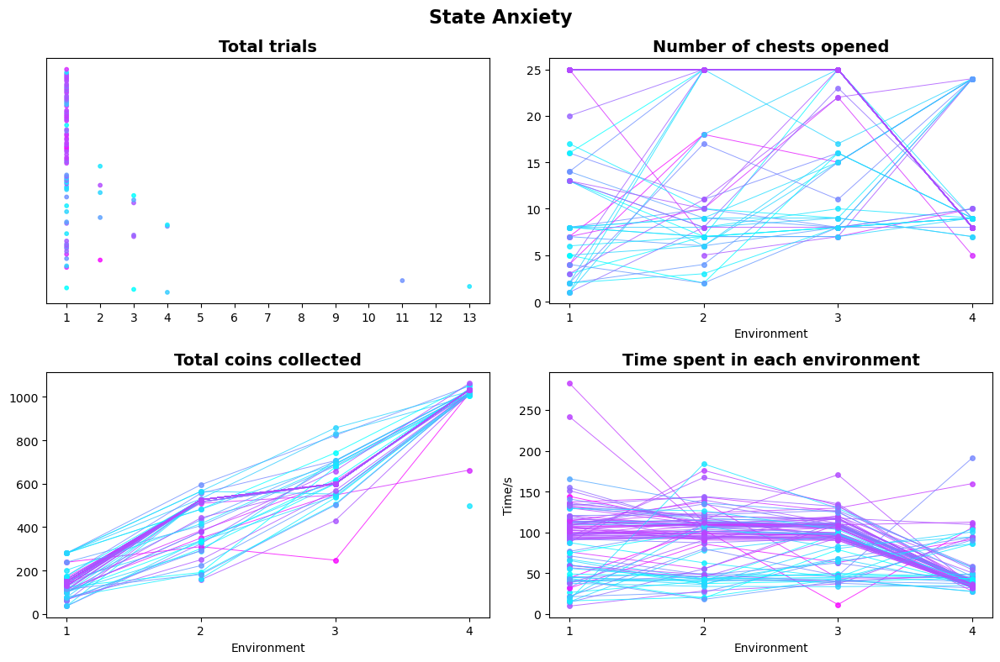

In [1020]:
fig_1, ax_1 = plt.subplots(2,2, figsize=(12, 8))

ax_1[0,0].scatter(totalTrials,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y))
ax_1[0,0].set_title('Total trials', size = 14, weight = 'bold')
ax_1[0,0].set_yticks([])
ax_1[0,0].set_xticks(np.arange(max_trial)+1)
fig_1.suptitle('State Anxiety', size = 16, weight = 'bold')

for i in range(data_length):

    env = np.arange(4)+1
    ax_1[0,1].plot(env,chestOpen[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y[i]))
    ax_1[0,1].set_title('Number of chests opened', size = 14, weight = 'bold')
    ax_1[0,1].set_xlabel("Environment")
    ax_1[0,1].set_xticks(env)

    ax_1[1,1].plot(env,totalTime[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y[i]))
    ax_1[1,1].set_ylabel('Time/s')
    ax_1[1,1].set_xlabel("Environment")
    ax_1[1,1].set_title('Time spent in each environment', size = 14, weight = 'bold')
    ax_1[1,1].set_xticks(env)

    ax_1[1,0].plot(env,totalCoins[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y[i]))
    ax_1[1,0].set_title('Total coins collected', size = 14, weight = 'bold')
    ax_1[1,0].set_xlabel("Environment")
    ax_1[1,0].set_xticks(env)
fig_1.tight_layout()


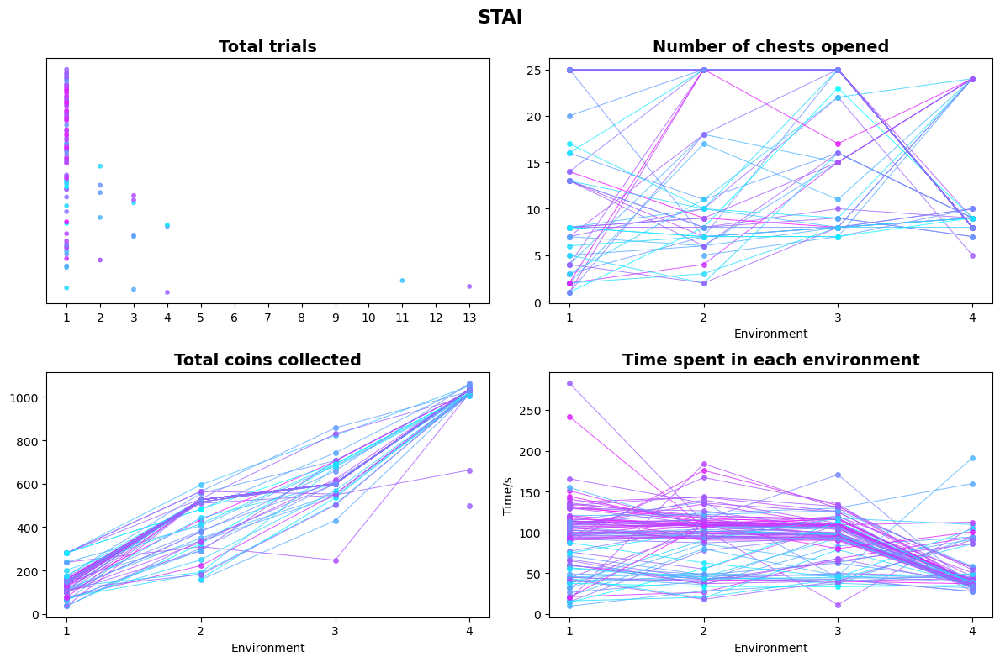

In [1021]:
fig_2, ax_2 = plt.subplots(2,2, figsize=(12, 8))

ax_2[0,0].scatter(totalTrials,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_stai))
ax_2[0,0].set_title('Total trials', size = 14, weight = 'bold')
ax_2[0,0].set_yticks([])
ax_2[0,0].set_xticks(np.arange(max_trial)+1)
fig_2.suptitle('STAI', size = 16, weight = 'bold')

for i in range(data_length):

    env = np.arange(4)+1
    ax_2[0,1].plot(env,chestOpen[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_stai[i]))
    ax_2[0,1].set_title('Number of chests opened', size = 14, weight = 'bold')
    ax_2[0,1].set_xlabel("Environment")
    ax_2[0,1].set_xticks(env)

    ax_2[1,1].plot(env,totalTime[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_stai[i]))
    ax_2[1,1].set_ylabel('Time/s')
    ax_2[1,1].set_xlabel("Environment")
    ax_2[1,1].set_title('Time spent in each environment', size = 14, weight = 'bold')
    ax_2[1,1].set_xticks(env)

    ax_2[1,0].plot(env,totalCoins[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_stai[i]))
    ax_2[1,0].set_title('Total coins collected', size = 14, weight = 'bold')
    ax_2[1,0].set_xlabel("Environment")
    ax_2[1,0].set_xticks(env)
fig_2.tight_layout()

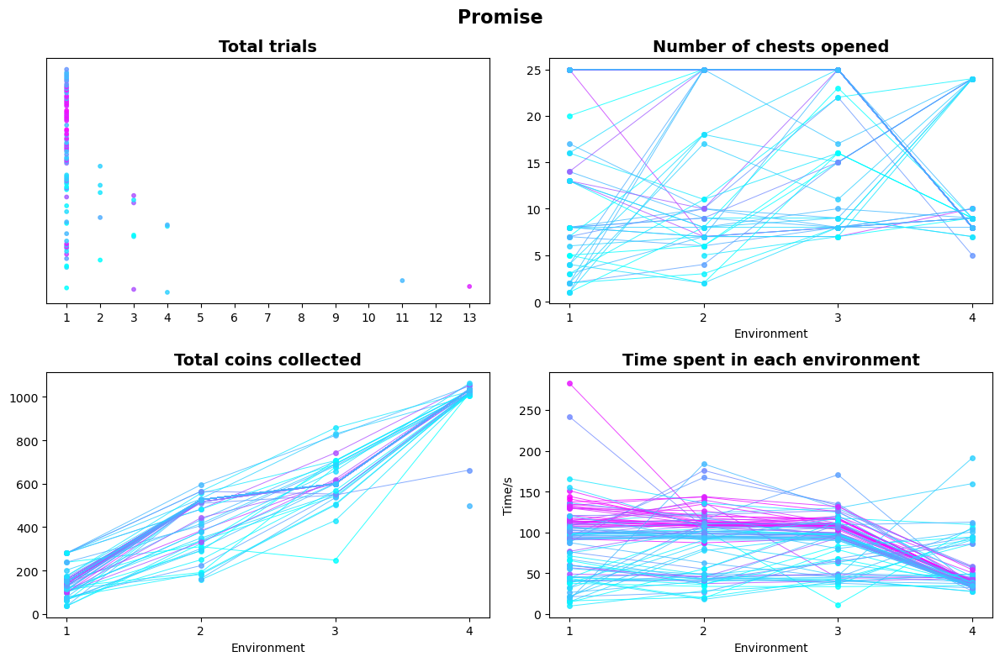

In [1022]:
fig_3, ax_3 = plt.subplots(2,2, figsize=(12, 8))

ax_3[0,0].scatter(totalTrials,subject_ID, alpha = 0.8, linewidth = 1, marker = 'o', s = 10, c = cm.cool(y_pro))
ax_3[0,0].set_title('Total trials', size = 14, weight = 'bold')
ax_3[0,0].set_yticks([])
ax_3[0,0].set_xticks(np.arange(max_trial)+1)
fig_3.suptitle('Promise', size = 16, weight = 'bold')

for i in range(data_length):

    env = np.arange(4)+1
    ax_3[0,1].plot(env,chestOpen[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_pro[i]))
    ax_3[0,1].set_title('Number of chests opened', size = 14, weight = 'bold')
    ax_3[0,1].set_xlabel("Environment")
    ax_3[0,1].set_xticks(env)

    ax_3[1,1].plot(env,totalTime[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_pro[i]))
    ax_3[1,1].set_ylabel('Time/s')
    ax_3[1,1].set_xlabel("Environment")
    ax_3[1,1].set_title('Time spent in each environment', size = 14, weight = 'bold')
    ax_3[1,1].set_xticks(env)

    ax_3[1,0].plot(env,totalCoins[totalTrials[i]-1,i,:], alpha = 0.8, linewidth = 0.7, marker = 'o', markersize = 4, color = cm.cool(y_pro[i]))
    ax_3[1,0].set_title('Total coins collected', size = 14, weight = 'bold')
    ax_3[1,0].set_xlabel("Environment")
    ax_3[1,0].set_xticks(env)
fig_3.tight_layout()

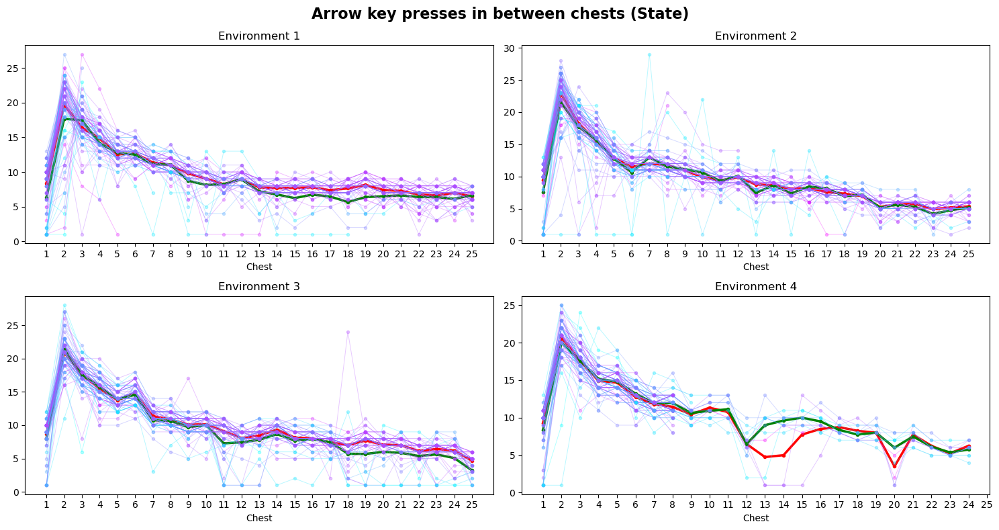

In [1023]:
fig_4, ax_4 = plt.subplots(2,2, figsize=(15, 8))
fig_4.suptitle('Arrow key presses in between chests (State)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_4[0,0].plot(x,plot_keypress[0][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_4[0,0].plot(x,plot_keypress[1][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_4[0,1].plot(x,plot_keypress[0][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_4[0,1].plot(x,plot_keypress[1][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_4[1,0].plot(x,plot_keypress[0][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_4[1,0].plot(x,plot_keypress[1][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_4[1,1].plot(x,plot_keypress[0][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_4[1,1].plot(x,plot_keypress[1][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_4[0,0].plot(x,keyPresses[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax1[0,0].plot(x,keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,0].plot(x,anx_keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_4[0,1].plot(x,keyPresses[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax1[0,1].plot(x,keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,1].plot(x,anx_keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_4[1,0].plot(x,keyPresses[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax1[1,0].plot(x,keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,0].plot(x,anx_keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_4[1,1].plot(x,keyPresses[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax1[1,1].plot(x,keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,1].plot(x,anx_keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_4[i,j].set_xlabel('Chest')
        ax_4[i,j].set_title('Environment '+str(2*i+j+1))
        ax_4[i,j].set_xticks(x)
fig_4.tight_layout()

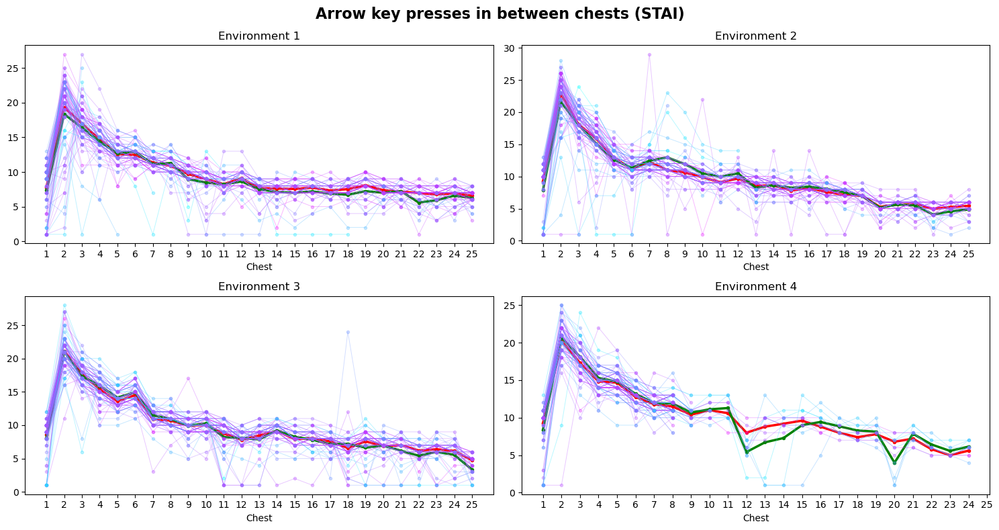

In [1024]:
fig_5, ax_5 = plt.subplots(2,2, figsize=(15, 8))
fig_5.suptitle('Arrow key presses in between chests (STAI)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_5[0,0].plot(x,plot_keypress[2][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_5[0,0].plot(x,plot_keypress[3][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_5[0,1].plot(x,plot_keypress[2][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_5[0,1].plot(x,plot_keypress[3][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_5[1,0].plot(x,plot_keypress[2][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_5[1,0].plot(x,plot_keypress[3][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_5[1,1].plot(x,plot_keypress[2][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_5[1,1].plot(x,plot_keypress[3][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_5[0,0].plot(x,keyPresses[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax1[0,0].plot(x,keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,0].plot(x,anx_keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_5[0,1].plot(x,keyPresses[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax1[0,1].plot(x,keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,1].plot(x,anx_keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_5[1,0].plot(x,keyPresses[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax1[1,0].plot(x,keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,0].plot(x,anx_keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_5[1,1].plot(x,keyPresses[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax1[1,1].plot(x,keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,1].plot(x,anx_keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_5[i,j].set_xlabel('Chest')
        ax_5[i,j].set_title('Environment '+str(2*i+j+1))
        ax_5[i,j].set_xticks(x)
fig_5.tight_layout()

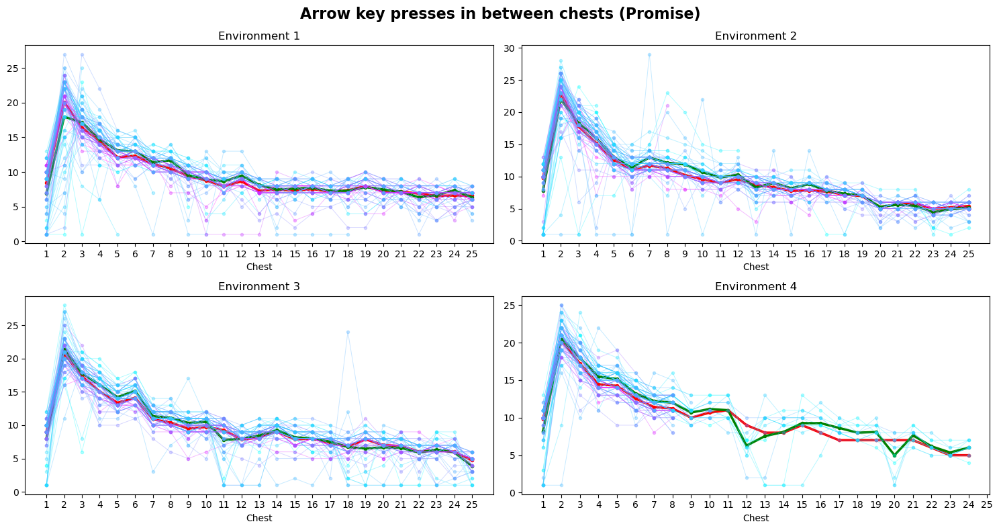

In [1025]:
fig_6, ax_6 = plt.subplots(2,2, figsize=(15, 8))
fig_6.suptitle('Arrow key presses in between chests (Promise)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_6[0,0].plot(x,plot_keypress[4][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_6[0,0].plot(x,plot_keypress[5][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_6[0,1].plot(x,plot_keypress[4][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_6[0,1].plot(x,plot_keypress[5][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_6[1,0].plot(x,plot_keypress[4][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_6[1,0].plot(x,plot_keypress[5][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_6[1,1].plot(x,plot_keypress[4][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_6[1,1].plot(x,plot_keypress[5][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_6[0,0].plot(x,keyPresses[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax1[0,0].plot(x,keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,0].plot(x,anx_keypress_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_6[0,1].plot(x,keyPresses[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax1[0,1].plot(x,keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[0,1].plot(x,anx_keypress_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_6[1,0].plot(x,keyPresses[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax1[1,0].plot(x,keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,0].plot(x,anx_keypress_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_6[1,1].plot(x,keyPresses[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax1[1,1].plot(x,keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax1[1,1].plot(x,anx_keypress_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_6[i,j].set_xlabel('Chest')
        ax_6[i,j].set_title('Environment '+str(2*i+j+1))
        ax_6[i,j].set_xticks(x)
fig_6.tight_layout()

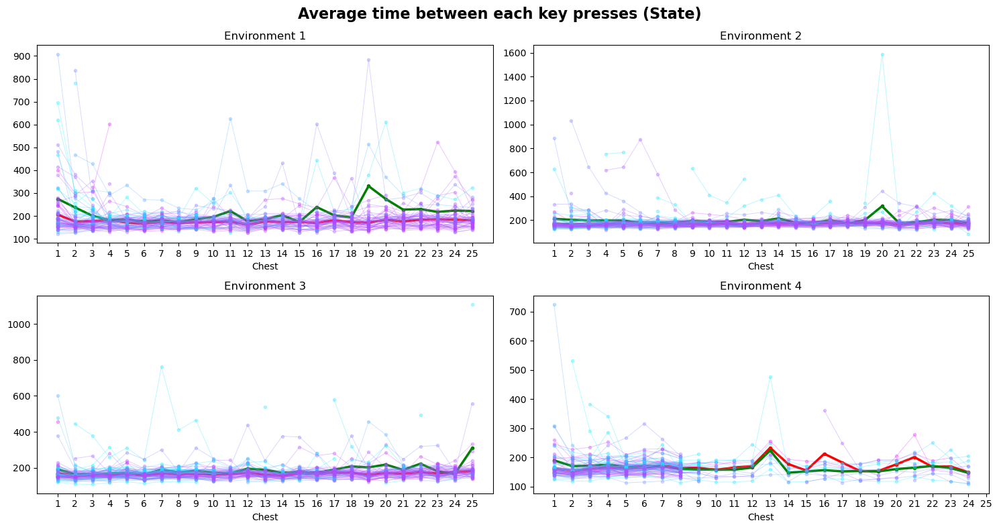

In [1026]:
fig_7, ax_7 = plt.subplots(2,2, figsize=(15, 8))
fig_7.suptitle('Average time between each key presses (State)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_7[0,0].plot(x,plot_keytime[0][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_7[0,0].plot(x,plot_keytime[1][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_7[0,1].plot(x,plot_keytime[0][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_7[0,1].plot(x,plot_keytime[1][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_7[1,0].plot(x,plot_keytime[0][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_7[1,0].plot(x,plot_keytime[1][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_7[1,1].plot(x,plot_keytime[0][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_7[1,1].plot(x,plot_keytime[1][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_7[0,0].plot(x,averageKeyTime[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax2[0,0].plot(x,keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,0].plot(x,anx_keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_7[0,1].plot(x,averageKeyTime[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax2[0,1].plot(x,keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,1].plot(x,anx_keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_7[1,0].plot(x,averageKeyTime[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax2[1,0].plot(x,keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,0].plot(x,anx_keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_7[1,1].plot(x,averageKeyTime[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax2[1,1].plot(x,keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,1].plot(x,anx_keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_7[i,j].set_xlabel('Chest')
        ax_7[i,j].set_title('Environment '+str(2*i+j+1))
        ax_7[i,j].set_xticks(x)
fig_7.tight_layout()

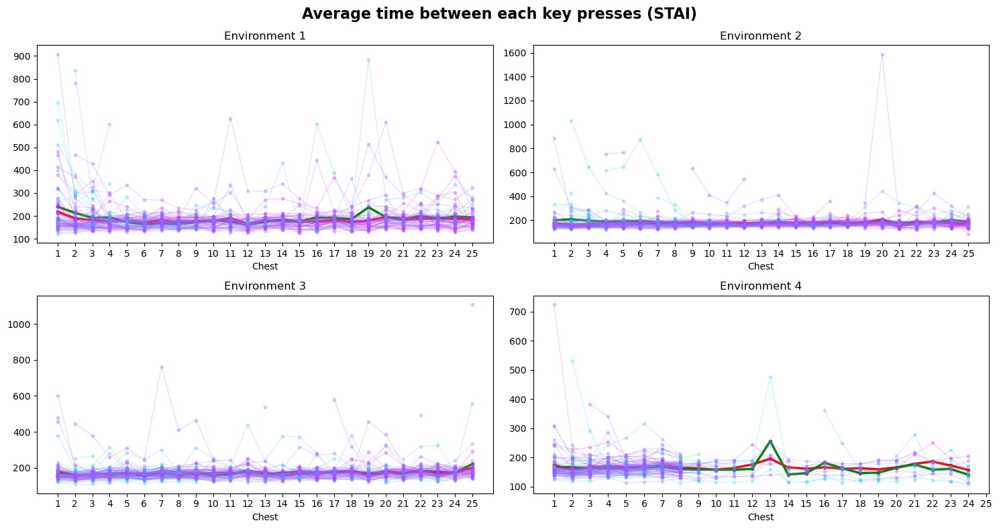

In [1027]:
fig_8, ax_8 = plt.subplots(2,2, figsize=(15, 8))
fig_8.suptitle('Average time between each key presses (STAI)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_8[0,0].plot(x,plot_keytime[2][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_8[0,0].plot(x,plot_keytime[3][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_8[0,1].plot(x,plot_keytime[2][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_8[0,1].plot(x,plot_keytime[3][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_8[1,0].plot(x,plot_keytime[2][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_8[1,0].plot(x,plot_keytime[3][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_8[1,1].plot(x,plot_keytime[2][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_8[1,1].plot(x,plot_keytime[3][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_8[0,0].plot(x,averageKeyTime[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax2[0,0].plot(x,keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,0].plot(x,anx_keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_8[0,1].plot(x,averageKeyTime[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax2[0,1].plot(x,keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,1].plot(x,anx_keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_8[1,0].plot(x,averageKeyTime[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax2[1,0].plot(x,keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,0].plot(x,anx_keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_8[1,1].plot(x,averageKeyTime[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax2[1,1].plot(x,keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,1].plot(x,anx_keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_8[i,j].set_xlabel('Chest')
        ax_8[i,j].set_title('Environment '+str(2*i+j+1))
        ax_8[i,j].set_xticks(x)
fig_8.tight_layout()

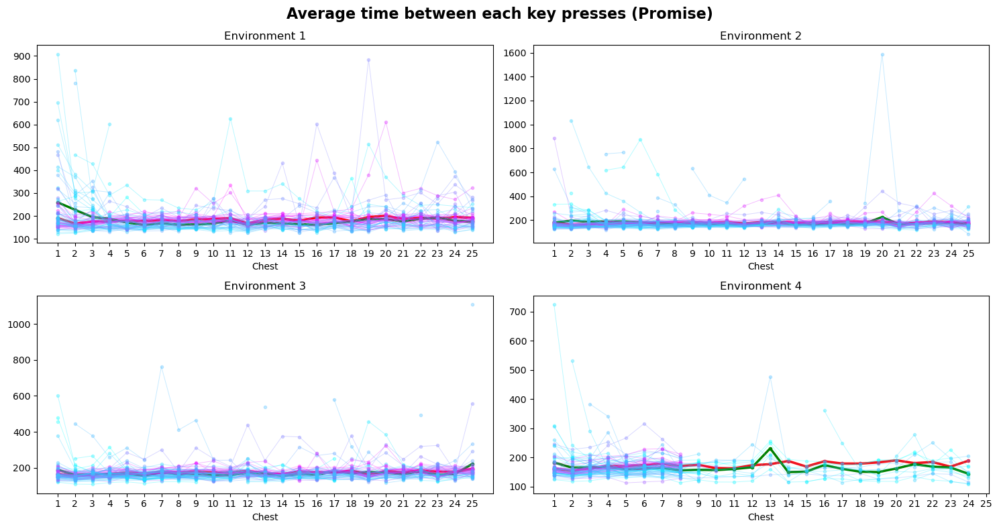

In [1028]:
fig_9, ax_9 = plt.subplots(2,2, figsize=(15, 8))
fig_9.suptitle('Average time between each key presses (Promise)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_9[0,0].plot(x,plot_keytime[4][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_9[0,0].plot(x,plot_keytime[5][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_9[0,1].plot(x,plot_keytime[4][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_9[0,1].plot(x,plot_keytime[5][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_9[1,0].plot(x,plot_keytime[4][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_9[1,0].plot(x,plot_keytime[5][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_9[1,1].plot(x,plot_keytime[4][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_9[1,1].plot(x,plot_keytime[5][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')
for i in range(data_length):
    ax_9[0,0].plot(x,averageKeyTime[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax2[0,0].plot(x,keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,0].plot(x,anx_keyTimes_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_9[0,1].plot(x,averageKeyTime[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax2[0,1].plot(x,keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[0,1].plot(x,anx_keyTimes_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_9[1,0].plot(x,averageKeyTime[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax2[1,0].plot(x,keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,0].plot(x,anx_keyTimes_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_9[1,1].plot(x,averageKeyTime[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax2[1,1].plot(x,keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax2[1,1].plot(x,anx_keyTimes_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
for i in range(2):
    for j in range(2):
        ax_9[i,j].set_xlabel('Chest')
        ax_9[i,j].set_title('Environment '+str(2*i+j+1))
        ax_9[i,j].set_xticks(x)
fig_9.tight_layout()

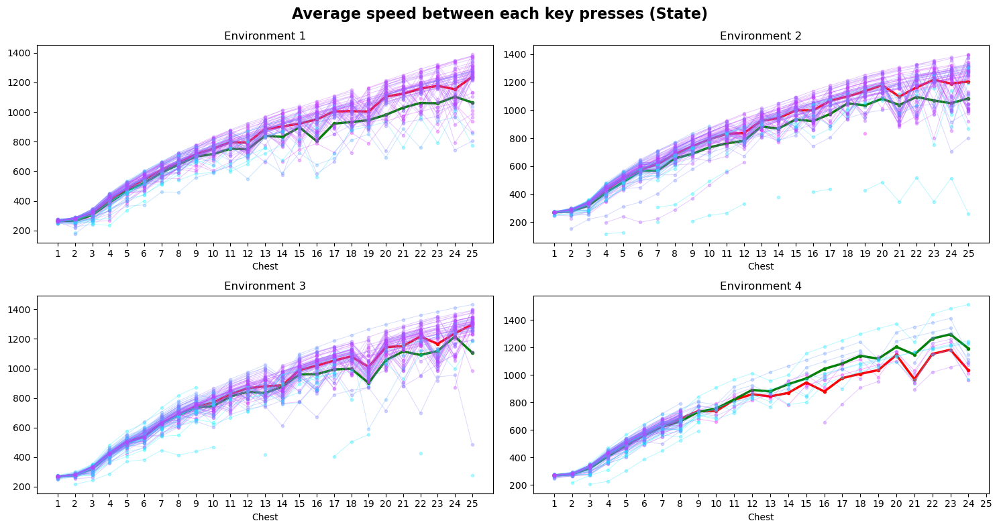

In [1029]:
fig_10, ax_10 = plt.subplots(2,2, figsize=(15, 8))
fig_10.suptitle('Average speed between each key presses (State)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_10[0,0].plot(x,plot_speed[0][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_10[0,0].plot(x,plot_speed[1][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_10[0,1].plot(x,plot_speed[0][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_10[0,1].plot(x,plot_speed[1][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_10[1,0].plot(x,plot_speed[0][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_10[1,0].plot(x,plot_speed[1][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_10[1,1].plot(x,plot_speed[0][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_10[1,1].plot(x,plot_speed[1][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_10[0,0].plot(x,averageSpeed[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax3[0,0].plot(x,speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,0].plot(x,anx_speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_10[0,1].plot(x,averageSpeed[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax3[0,1].plot(x,speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,1].plot(x,anx_speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_10[1,0].plot(x,averageSpeed[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax3[1,0].plot(x,speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,0].plot(x,anx_speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_10[1,1].plot(x,averageSpeed[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    #ax3[1,1].plot(x,speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,1].plot(x,anx_speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
for i in range(2):
    for j in range(2):
        ax_10[i,j].set_xlabel('Chest')
        ax_10[i,j].set_title('Environment '+str(2*i+j+1))
        ax_10[i,j].set_xticks(x)
fig_10.tight_layout()

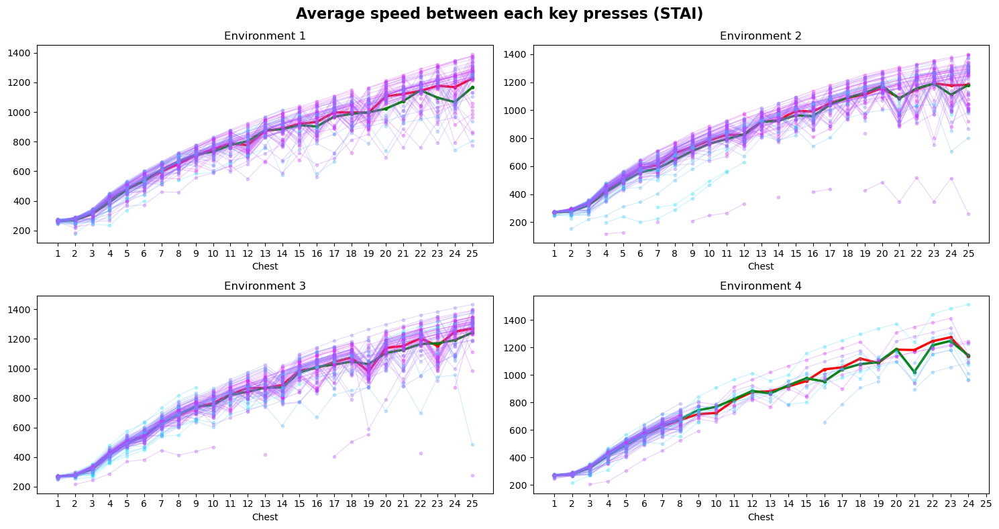

In [1030]:
fig_11, ax_11 = plt.subplots(2,2, figsize=(15, 8))
fig_11.suptitle('Average speed between each key presses (STAI)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_11[0,0].plot(x,plot_speed[2][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_11[0,0].plot(x,plot_speed[3][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_11[0,1].plot(x,plot_speed[2][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_11[0,1].plot(x,plot_speed[3][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_11[1,0].plot(x,plot_speed[2][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_11[1,0].plot(x,plot_speed[3][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_11[1,1].plot(x,plot_speed[2][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_11[1,1].plot(x,plot_speed[3][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')
for i in range(data_length):
    ax_11[0,0].plot(x,averageSpeed[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax3[0,0].plot(x,speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,0].plot(x,anx_speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_11[0,1].plot(x,averageSpeed[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax3[0,1].plot(x,speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,1].plot(x,anx_speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_11[1,0].plot(x,averageSpeed[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax3[1,0].plot(x,speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,0].plot(x,anx_speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_11[1,1].plot(x,averageSpeed[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    #ax3[1,1].plot(x,speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,1].plot(x,anx_speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
for i in range(2):
    for j in range(2):
        ax_11[i,j].set_xlabel('Chest')
        ax_11[i,j].set_title('Environment '+str(2*i+j+1))
        ax_11[i,j].set_xticks(x)
fig_11.tight_layout()

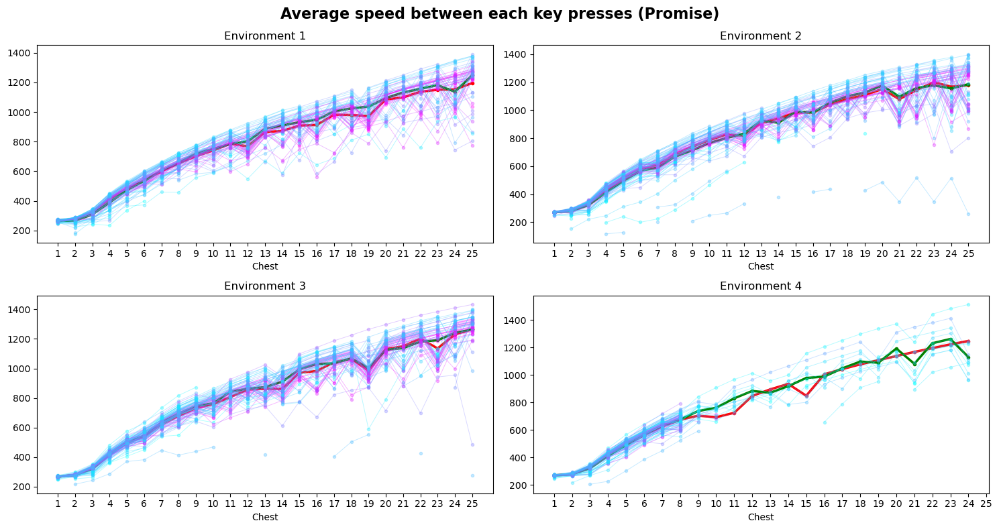

In [1031]:
fig_12, ax_12 = plt.subplots(2,2, figsize=(15, 8))
fig_12.suptitle('Average speed between each key presses (Promise)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_12[0,0].plot(x,plot_speed[4][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_12[0,0].plot(x,plot_speed[5][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_12[0,1].plot(x,plot_speed[4][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_12[0,1].plot(x,plot_speed[5][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_12[1,0].plot(x,plot_speed[4][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_12[1,0].plot(x,plot_speed[5][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_12[1,1].plot(x,plot_speed[4][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_12[1,1].plot(x,plot_speed[5][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_12[0,0].plot(x,averageSpeed[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax3[0,0].plot(x,speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,0].plot(x,anx_speed_env1, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_12[0,1].plot(x,averageSpeed[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax3[0,1].plot(x,speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[0,1].plot(x,anx_speed_env2, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_12[1,0].plot(x,averageSpeed[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax3[1,0].plot(x,speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,0].plot(x,anx_speed_env3, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
    ax_12[1,1].plot(x,averageSpeed[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    #ax3[1,1].plot(x,speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'g')
    #ax3[1,1].plot(x,anx_speed_env4, alpha = 1, linewidth = 0.7, marker = 'o', markersize = 3, color = 'r')
    
for i in range(2):
    for j in range(2):
        ax_12[i,j].set_xlabel('Chest')
        ax_12[i,j].set_title('Environment '+str(2*i+j+1))
        ax_12[i,j].set_xticks(x)
fig_12.tight_layout()

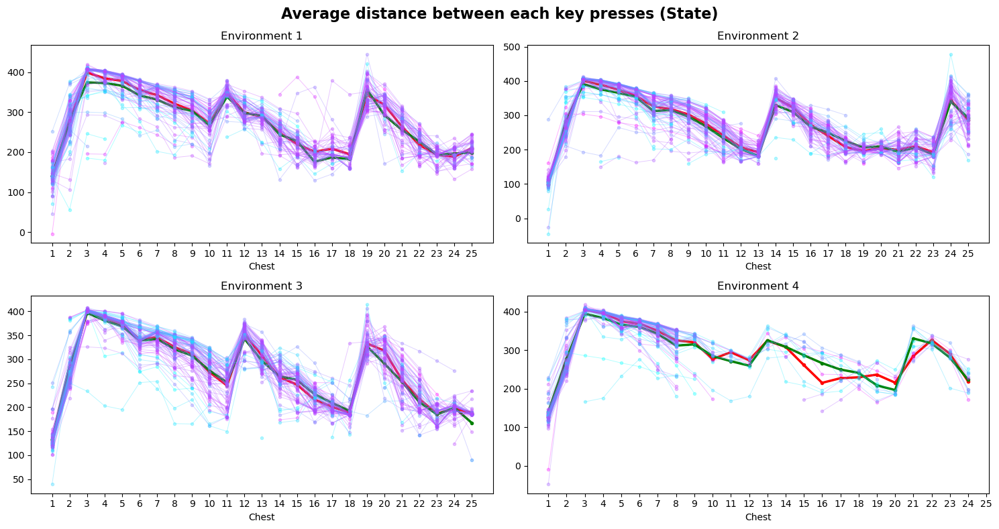

In [1032]:
fig_13, ax_13 = plt.subplots(2,2, figsize=(15, 8))
fig_13.suptitle('Average distance between each key presses (State)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_13[0,0].plot(x,plot_distance[0][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_13[0,0].plot(x,plot_distance[1][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_13[0,1].plot(x,plot_distance[0][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_13[0,1].plot(x,plot_distance[1][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_13[1,0].plot(x,plot_distance[0][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_13[1,0].plot(x,plot_distance[1][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_13[1,1].plot(x,plot_distance[0][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_13[1,1].plot(x,plot_distance[1][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_13[0,0].plot(x,averageDistance[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_13[0,1].plot(x,averageDistance[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_13[1,0].plot(x,averageDistance[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_13[1,1].plot(x,averageDistance[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
for i in range(2):
    for j in range(2):
        ax_13[i,j].set_xlabel('Chest')
        ax_13[i,j].set_title('Environment '+str(2*i+j+1))
        ax_13[i,j].set_xticks(x)
fig_13.tight_layout()

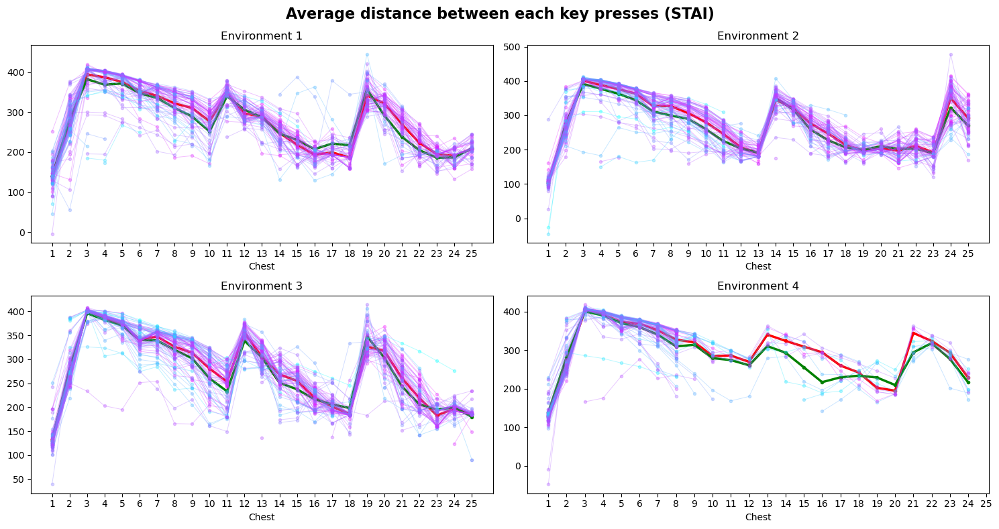

In [1033]:
fig_14, ax_14 = plt.subplots(2,2, figsize=(15, 8))
fig_14.suptitle('Average distance between each key presses (STAI)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_14[0,0].plot(x,plot_distance[2][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_14[0,0].plot(x,plot_distance[3][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_14[0,1].plot(x,plot_distance[2][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_14[0,1].plot(x,plot_distance[3][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_14[1,0].plot(x,plot_distance[2][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_14[1,0].plot(x,plot_distance[3][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_14[1,1].plot(x,plot_distance[2][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_14[1,1].plot(x,plot_distance[3][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_14[0,0].plot(x,averageDistance[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_14[0,1].plot(x,averageDistance[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_14[1,0].plot(x,averageDistance[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_14[1,1].plot(x,averageDistance[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
for i in range(2):
    for j in range(2):
        ax_14[i,j].set_xlabel('Chest')
        ax_14[i,j].set_title('Environment '+str(2*i+j+1))
        ax_14[i,j].set_xticks(x)
fig_14.tight_layout()

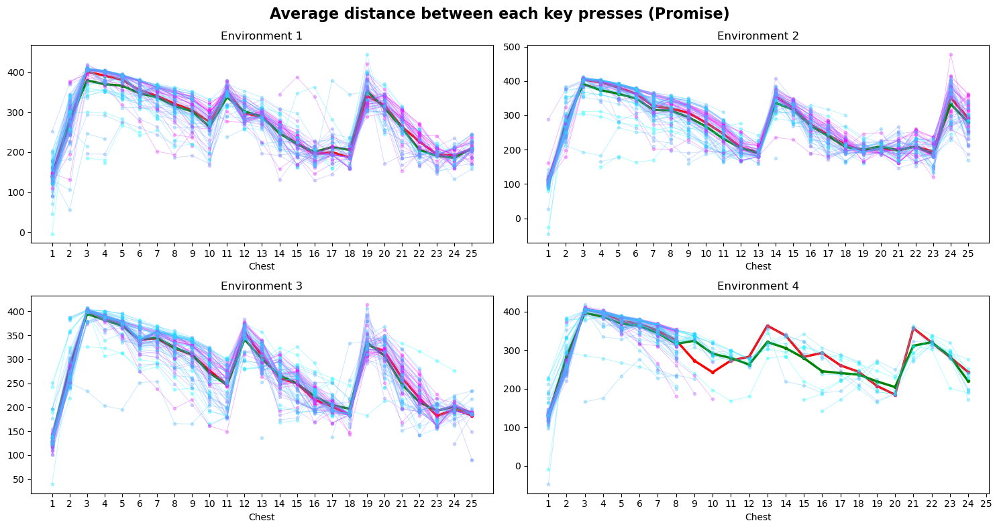

In [1034]:
fig_15, ax_15 = plt.subplots(2,2, figsize=(15, 8))
fig_15.suptitle('Average distance between each key presses (Promise)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_15[0,0].plot(x,plot_distance[4][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_15[0,0].plot(x,plot_distance[5][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_15[0,1].plot(x,plot_distance[4][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_15[0,1].plot(x,plot_distance[5][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_15[1,0].plot(x,plot_distance[4][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_15[1,0].plot(x,plot_distance[5][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_15[1,1].plot(x,plot_distance[4][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_15[1,1].plot(x,plot_distance[5][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_15[0,0].plot(x,averageDistance[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_15[0,1].plot(x,averageDistance[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_15[1,0].plot(x,averageDistance[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_15[1,1].plot(x,averageDistance[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
for i in range(2):
    for j in range(2):
        ax_15[i,j].set_xlabel('Chest')
        ax_15[i,j].set_title('Environment '+str(2*i+j+1))
        ax_15[i,j].set_xticks(x)
fig_15.tight_layout()

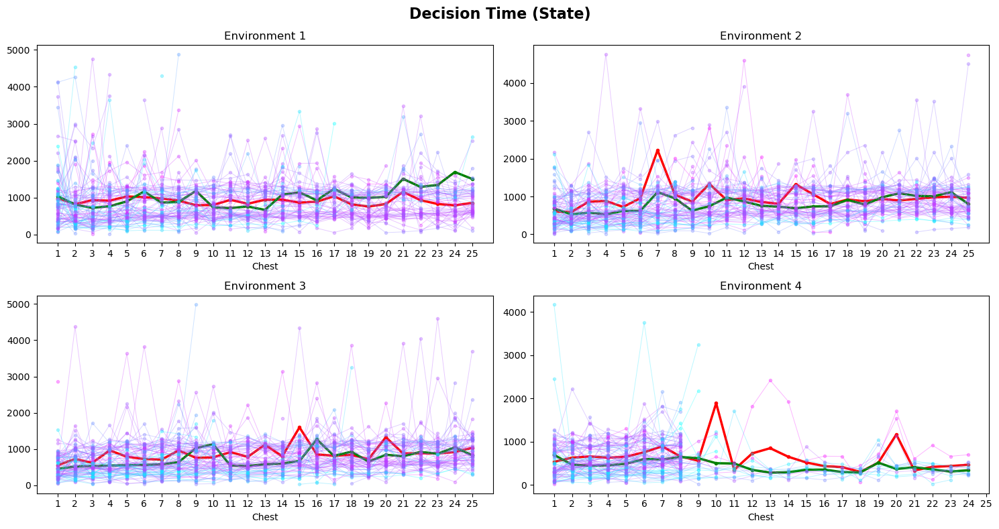

In [1035]:
fig_16, ax_16 = plt.subplots(2,2, figsize=(15, 8))
fig_16.suptitle('Decision Time (State)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_16[0,0].plot(x,plot_decitionTime[0][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_16[0,0].plot(x,plot_decitionTime[1][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_16[0,1].plot(x,plot_decitionTime[0][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_16[0,1].plot(x,plot_decitionTime[1][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_16[1,0].plot(x,plot_decitionTime[0][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_16[1,0].plot(x,plot_decitionTime[1][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_16[1,1].plot(x,plot_decitionTime[0][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_16[1,1].plot(x,plot_decitionTime[1][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_16[0,0].plot(x,decisionTime[totalTrials[i]-1,i,0,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_16[0,1].plot(x,decisionTime[totalTrials[i]-1,i,1,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_16[1,0].plot(x,decisionTime[totalTrials[i]-1,i,2,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
    ax_16[1,1].plot(x,decisionTime[totalTrials[i]-1,i,3,:], alpha = 0.3, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y[i]))
for i in range(2):
    for j in range(2):
        ax_16[i,j].set_xlabel('Chest')
        ax_16[i,j].set_title('Environment '+str(2*i+j+1))
        ax_16[i,j].set_xticks(x)
fig_16.tight_layout()


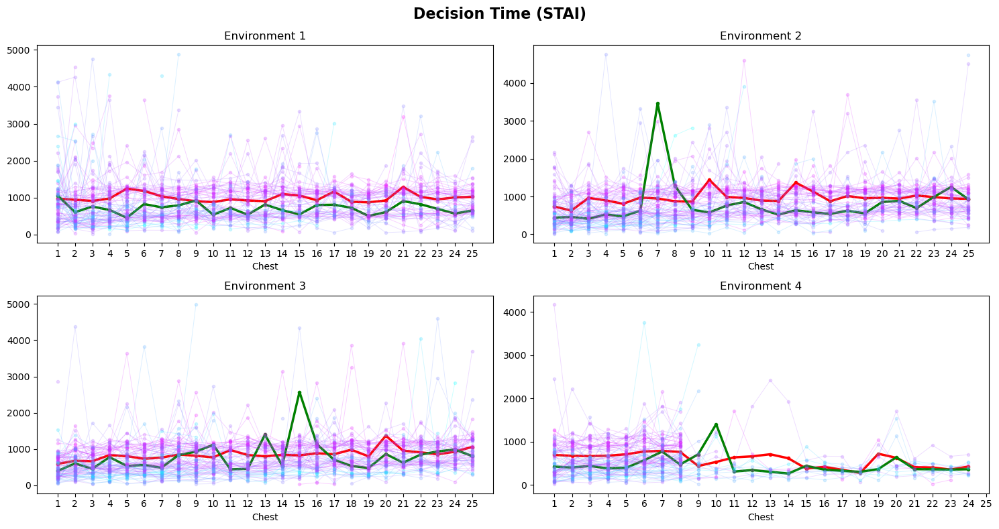

In [1036]:
fig_17, ax_17 = plt.subplots(2,2, figsize=(15, 8))
fig_17.suptitle('Decision Time (STAI)', size = 16, weight = 'bold')
x = np.arange(25)+1
ax_17[0,0].plot(x,plot_decitionTime[2][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_17[0,0].plot(x,plot_decitionTime[3][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_17[0,1].plot(x,plot_decitionTime[2][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_17[0,1].plot(x,plot_decitionTime[3][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_17[1,0].plot(x,plot_decitionTime[2][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_17[1,0].plot(x,plot_decitionTime[3][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_17[1,1].plot(x,plot_decitionTime[2][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_17[1,1].plot(x,plot_decitionTime[3][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')
for i in range(data_length):
    ax_17[0,0].plot(x,decisionTime[totalTrials[i]-1,i,0,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_17[0,1].plot(x,decisionTime[totalTrials[i]-1,i,1,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_17[1,0].plot(x,decisionTime[totalTrials[i]-1,i,2,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
    ax_17[1,1].plot(x,decisionTime[totalTrials[i]-1,i,3,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_stai[i]))
for i in range(2):
    for j in range(2):
        ax_17[i,j].set_xlabel('Chest')
        ax_17[i,j].set_title('Environment '+str(2*i+j+1))
        ax_17[i,j].set_xticks(x)
fig_17.tight_layout()

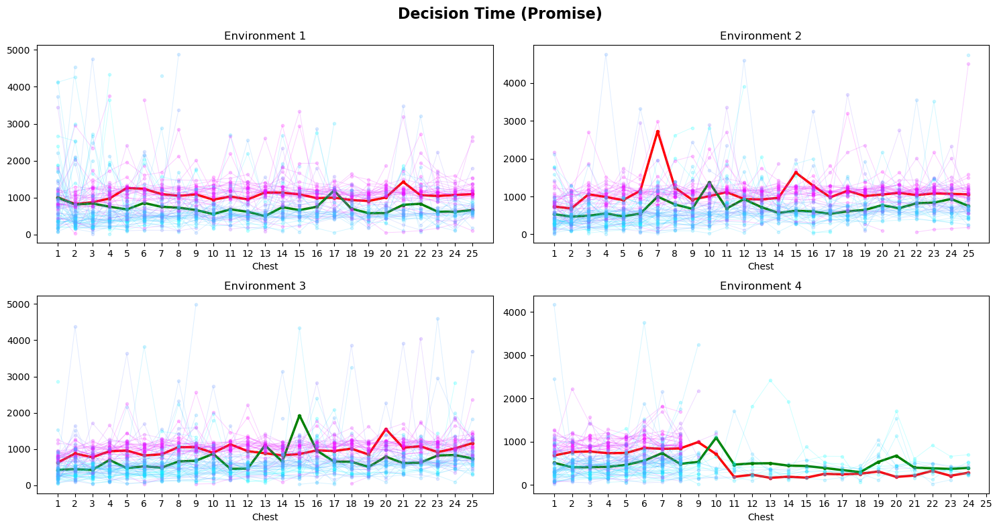

In [1037]:
fig_18, ax_18 = plt.subplots(2,2, figsize=(15, 8))
fig_18.suptitle('Decision Time (Promise)', size = 16, weight = 'bold')
x = np.arange(25)+1

ax_18[0,0].plot(x,plot_decitionTime[4][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_18[0,0].plot(x,plot_decitionTime[5][0:25], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_18[0,1].plot(x,plot_decitionTime[4][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_18[0,1].plot(x,plot_decitionTime[5][25:50], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_18[1,0].plot(x,plot_decitionTime[4][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_18[1,0].plot(x,plot_decitionTime[5][50:75], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

ax_18[1,1].plot(x,plot_decitionTime[4][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'r')
ax_18[1,1].plot(x,plot_decitionTime[5][75:100], alpha = 1, linewidth = 2.5, marker = 'o', markersize = 3, color = 'g')

for i in range(data_length):
    ax_18[0,0].plot(x,decisionTime[totalTrials[i]-1,i,0,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_18[0,1].plot(x,decisionTime[totalTrials[i]-1,i,1,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_18[1,0].plot(x,decisionTime[totalTrials[i]-1,i,2,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
    ax_18[1,1].plot(x,decisionTime[totalTrials[i]-1,i,3,:], alpha = 0.2, linewidth = 0.7, marker = 'o', markersize = 3, color = cm.cool(y_pro[i]))
for i in range(2):
    for j in range(2):
        ax_18[i,j].set_xlabel('Chest')
        ax_18[i,j].set_title('Environment '+str(2*i+j+1))
        ax_18[i,j].set_xticks(x)
fig_18.tight_layout()

### 2. Regression over whole data:

The data inclues: number of key presses, time between key presses, distance between ogre and play at key press, speed of player at key press, decision time at chest,  number of times the player is caught, and coins collected at each environment

In [1038]:
#linear_reg_1 = linear_model.BayesianRidge()
#linear_reg_1.fit(train_data_1,y_train)
#y_pred_1 = linear_reg_1.predict(test_data_1)
#print('MSE: ' + str(metrics.mean_squared_error(y_test,y_pred_1)))

linear_reg_2 = linear_model.BayesianRidge()
linear_reg_2.fit(train_data_2,y_train)
y_pred_2 = linear_reg_2.predict(test_data_2)
print('MSE: ' + str(metrics.mean_squared_error(y_test,y_pred_2)))

MSE: 0.03398570152227985


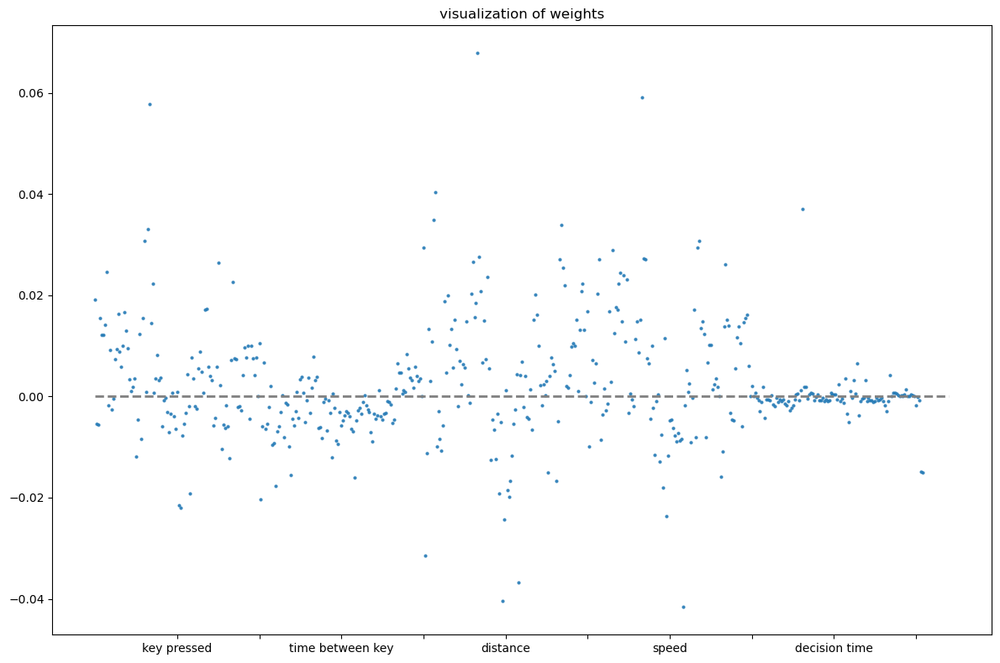

In [1039]:
fig1, ax1 = plt.subplots( figsize=(12, 8))
#x_1 = np.arange(train_data_1.shape[1])
x_2 = np.arange(train_data_2.shape[1])
#ax1[0].scatter(x_1,linear_reg_1.coef_,alpha = 0.8, linewidth = 1, marker = 'o', s = 4)
ax1.scatter(x_2,linear_reg_2.coef_,alpha = 0.8, linewidth = 1, marker = 'o', s = 4)
ax1.hlines(y=[0], xmin=[0], xmax=[520], colors='gray', linestyles='--', lw=2)
#ax1[0].set_xticks([50,100,150,200,250,300,350,400,450,500])
#ax1[0].set_xticklabels(['key pressed','','time between key','','distance','','speed','','decision time',''])
ax1.set_xticks([50,100,150,200,250,300,350,400,450,500])
ax1.set_xticklabels(['key pressed','','time between key','','distance','','speed','','decision time',''])
ax1.set_title('visualization of weights')
fig1.tight_layout()